# Base Delicious - RNN

# 0. Estruturação do dataframe

In [1]:
import pandas as pd
import seaborn as sns
import numpy as np
import networkx as nx
import sklearn as skl
from scipy import stats
import matplotlib.pyplot as plt
from sklearn.metrics import pairwise_distances
from scipy.sparse import coo_matrix, csr_matrix
from scipy.sparse.csgraph import minimum_spanning_tree
from sklearn.neighbors import RadiusNeighborsClassifier
from sklearn.neighbors import kneighbors_graph, radius_neighbors_graph
from sklearn.metrics.pairwise import euclidean_distances, cosine_distances

In [2]:
# criando um dataframe do arquivo lido pelo pandas 
df = pd.read_csv('cometa_csv/delicious.csv')

# selecionando as tags
m_delicious = df.loc[:, "TAG_.imported":"TAG_youtube"]

# uma vez que a distância entre as instâncias é calculada por comparação entre colunas, transponho a m_flags 
mt_delicious = np.array(m_delicious).T

# configurando as casas decimais que irão ser impressas 
np.set_printoptions(precision=3)

In [34]:
df.head()

,_qacct,accessing,actionscript,activerecord,addoverlay,afternoon,against,air,ajax_action,als,...,TAG_words,TAG_work,TAG_world,TAG_wp,TAG_writing,TAG_xhtml,TAG_xml,TAG_xp,TAG_yahoo,TAG_youtube
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,1,1,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [38]:
colunas = df.columns[df.columns.get_loc("TAG_.imported"):df.columns.get_loc("TAG_youtube") + 1]
print(colunas)


Index(['TAG_.imported', 'TAG_.net', 'TAG_2.0', 'TAG_2007', 'TAG_3d', 'TAG_??',
       'TAG_???', 'TAG_????', 'TAG_academia', 'TAG_academic',
       ...
       'TAG_words', 'TAG_work', 'TAG_world', 'TAG_wp', 'TAG_writing',
       'TAG_xhtml', 'TAG_xml', 'TAG_xp', 'TAG_yahoo', 'TAG_youtube'],
      dtype='object', length=983)


# 1. Definindo funções que serão utilizadas 

- **draw_graph**: utilizada para gerar o grafo completo a partir da da matriz de distância usando como métrica a distância inserida
    - Cada elemento na matriz representa a distância (por exemplo Jaccard) entre duas amostras específicas.
    

- **draw_rnc_graph**: utilizada para gerar o grafo esparsificado por rnc
    - o grafo é gerado tendo como base uma matriz esparsa 
    - O grafo é construído de tal forma que cada ponto da matriz matriz é conectado com outros pontos que estão dentro de uma distância específica (definida pelo argumento radius).
    - O argumento r especifica o raio a ser utilizado para incluir os vizinhos mais próximos para cada amostra. 
    - O argumento mode especifica se a distância entre as amostras será armazenada como uma distância ou como uma similaridade. Se o mode for definido como 'distance', então as distâncias serão armazenadas na matriz. 
    - O argumento metric especifica a métrica de distância a ser usada para calcular a distância entre as amostras. 
    - O argumento include_self especifica se cada amostra será incluída como um dos seus próprios vizinhos mais próximos.
    
    **OBS**: os valores de máximo e minimo são uma forma de visualizar o intervalo que devo estipular o histograma para ver a distribuição


- **draw_histogram**: utilizado para visualizar a distribuição dos valores da matriz m 
    - utilzado para ter uma ideia de qual intervalo faz mais sentido estipular um raio. 

In [3]:
def draw_graph(metric, color, matriz):
    m = skl.metrics.pairwise_distances(matriz, metric=metric)


    G = nx.from_numpy_array(m)
    list(nx.selfloop_edges(G))
    G.remove_edges_from(nx.selfloop_edges(G))

    minimum_value = np.min(m)
    maximum_value = np.max(m)

    print("Minimum value in matrix:", minimum_value)
    print("Maximum value in matrix:", maximum_value)

    plt.figure(num=None, figsize=(10, 10), dpi=80)
    nx.draw(G, with_labels=False, node_color=color, node_size = 100) 
    plt.title(f'Base "Delicious" - Grafo completo usando {metric}', fontsize=17)
    plt.show()

In [4]:
def draw_rnc_graph(radius, metric, cor, matriz):
    sparse_matrix_rnc = radius_neighbors_graph(matriz, radius, mode='distance', metric=metric, include_self=False)

    G_sparse_rnc = nx.from_numpy_array(sparse_matrix_rnc)
    G_sparse_rnc.remove_edges_from(nx.selfloop_edges(G_sparse_rnc))

    plt.figure(num=None, figsize=(10, 10), dpi=80)
    nx.draw(G_sparse_rnc, with_labels=False, node_color=cor, node_size = 100, edgecolors='gray') 
    plt.title(f'Base "Delicious" - Grafo esparsificado por Radius Neighbors Classifier usando {metric} e raio={radius}', fontsize=17)
    plt.show()


In [5]:
def draw_histogram(matriz, metric, xinf, xsup):
    m = skl.metrics.pairwise_distances(matriz, metric=metric)
    plt.hist(m, bins=20)
    plt.xlabel("Paired Distance")
    plt.ylabel("Frequency")
    plt.title("Histogram of Paired Distances")
    plt.xlim(xinf, xsup)
    plt.show()

#### Sobre o MST graph 
- Calcula-se a distância euclidiana entre todas as amostras, resultando na matriz D. 
- Em seguida, é calculada a Árvore Geradora Mínima (Minimum Spanning Tree - MST) da matriz D com a função minimum_spanning_tree
- Retorna uma matriz direcionada, adj_directed, representando o grafo da MST.

#### Transformando o grafo dir em não direcionado
Para transformar o grafo direcionado em um grafo não-direcionado, o código **adiciona a transposta de adj_directed a si mesma e define todas as arestas com valor maior que zero como 1**
. Por fim, a diagonal da matriz resultante é preenchida com 0 para evitar auto-loops no grafo.

In [6]:
def mst_graph(X):
    D = euclidean_distances(X, X)
    adj_directed = minimum_spanning_tree(D).toarray()
    adj = adj_directed + adj_directed.T
    adj[adj > 0] = 1
    np.fill_diagonal(adj,0)

    return csr_matrix(adj)

In [7]:
def draw_conex_graph(raio, metric,  color, matriz):
    W = radius_neighbors_graph(matriz, raio, mode="distance", metric=metric, include_self=False)
    W = W + mst_graph(matriz)
    
    G = nx.from_numpy_array(W)
    plt.figure(num=None, figsize=(10, 10), dpi=80)
    nx.draw(G, with_labels=False, node_color=color, node_size = 100, edgecolors='gray') 
    plt.title(f'Base "Delicious" - Grafo conexo usando RNN com raio = {raio} e metrica {metric}', fontsize=17)
    plt.show()


In [9]:
# W = radius_neighbors_graph(mt_delicious, 0.8, mode="distance", metric="euclidean", include_self=False)
# W = W + mst_graph(mt_delicious)

In [15]:
# G = nx.from_numpy_array(W)
# plt.figure(num=None, figsize=(10, 10), dpi=80)
# nx.draw(G, with_labels=False, node_color='lightpink', node_size = 100, edgecolors='gray') 
# plt.title(f'Base "Delicious" - Grafo conexo usando RNN e metrica {euclidiana}', fontsize=17)
# plt.show()


**Gerando um grafo conexo** com MST

É gerado um grafo esparsificado pelo raio vizinho com a função radius_neighbors_graph, utilizando um raio de 0,8, modo de distância, métrica euclidiana e sem incluir a amostra consigo mesma. Este grafo é adicionado ao grafo da MST gerado anteriormente para obter o resultado final. O resultado final é retornado como uma matriz de coo (compressed sparse row).

# 2. Aplicando Knn para as distâncias definidas 

## 2.1) Euclidiana

#### Grafo completo

O código acima gera um grafo a partir da matriz de recursos mt_delicious de forma que suas arestas conectem todos os vértices que estejam a uma distância de até 0,8, medida pela distância Euclidiana, do ponto de partida. Em seguida, o grafo gerado é adicionado ao resultado da geração do grafo mínimo de árvore gerador.

A função radius_neighbors_graph da biblioteca scikit-learn é usada para gerar o primeiro grafo. Ela aceita como entrada uma matriz de recursos, um raio de distância, um modo de distância (neste caso, distância Euclidiana), uma métrica (também distância Euclidiana) e uma opção para incluir ou não o próprio vértice como um vizinho.

A função mst_graph é usada para gerar o segundo grafo, que é o grafo mínimo de árvore gerador. Ela recebe como entrada uma matriz de recursos e retorna a matriz de adjacência do grafo gerado.

Ao final, o grafo gerado pela função radius_neighbors_graph é adicionado ao grafo gerado pela função mst_graph, resultando em um grafo completo.

Minimum value in matrix: 0.0
Maximum value in matrix: 88.12491134747314


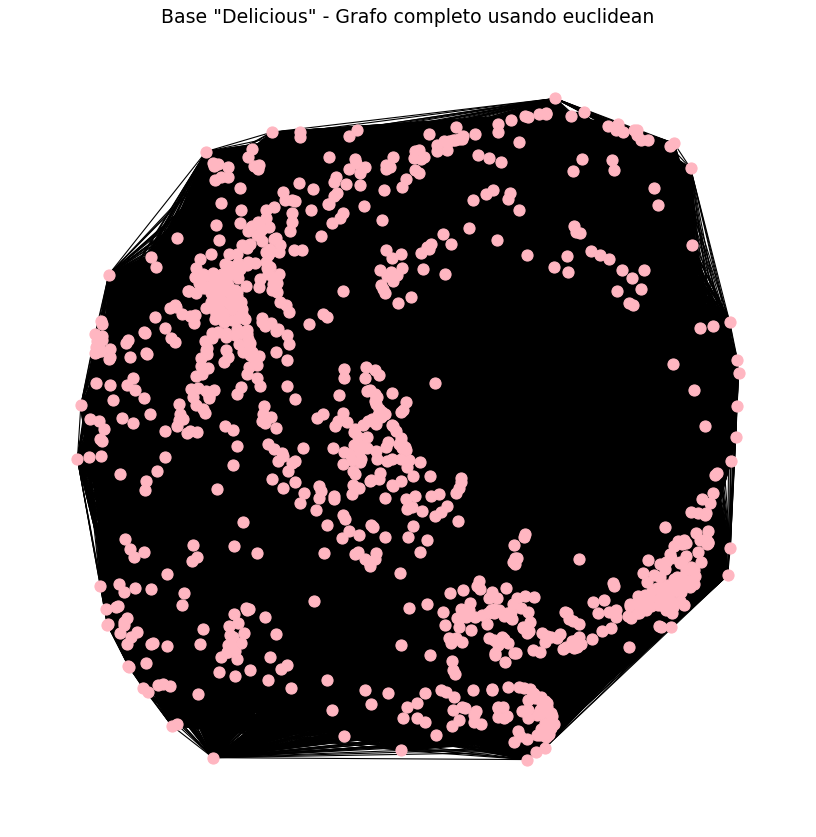

In [11]:
draw_graph('euclidean', 'lightpink', mt_delicious)

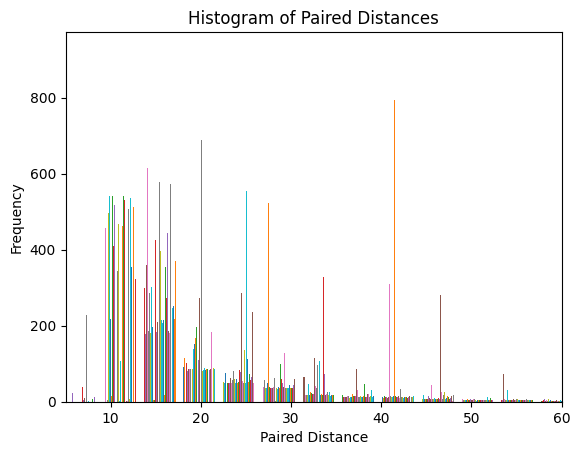

In [8]:
draw_histogram(mt_delicious, 'euclidean', 5,60)

In [43]:
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import RadiusNeighborsClassifier

# Definir a grade de parâmetros a ser testada
param_grid = {'radius': [10, 15, 20], 'metric': ['euclidean', 'manhattan']}

# Criar o estimador
estimator = RadiusNeighborsClassifier()

# Criar o objeto GridSearchCV
grid_search = GridSearchCV(estimator, param_grid, cv=2)

target =  colunas

# Ajustar o modelo aos dados
grid_search.fit(m_delicious, target)

# Exibir os melhores parâmetros e a pontuação
print('Melhores parâmetros:', grid_search.best_params_)
print('Melhor pontuação:', grid_search.best_score_)


ValueError: Found input variables with inconsistent numbers of samples: [16105, 983]

### Grafos esparsificados

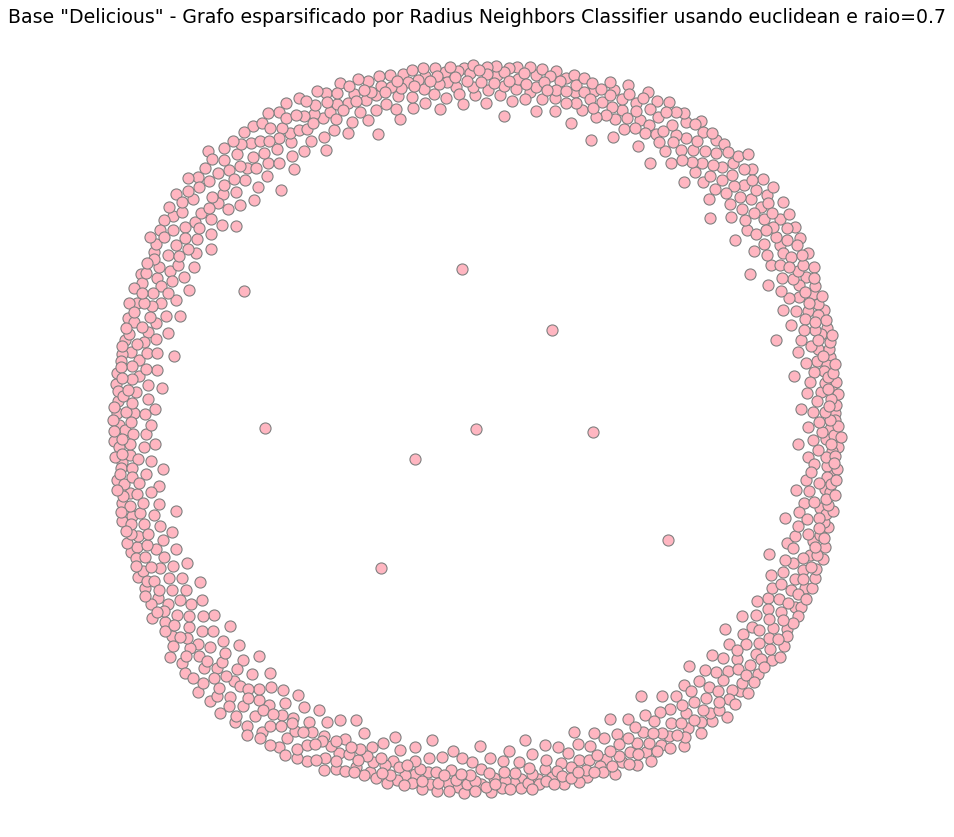

In [8]:
draw_rnc_graph(0.7,'euclidean', 'lightpink', mt_delicious)


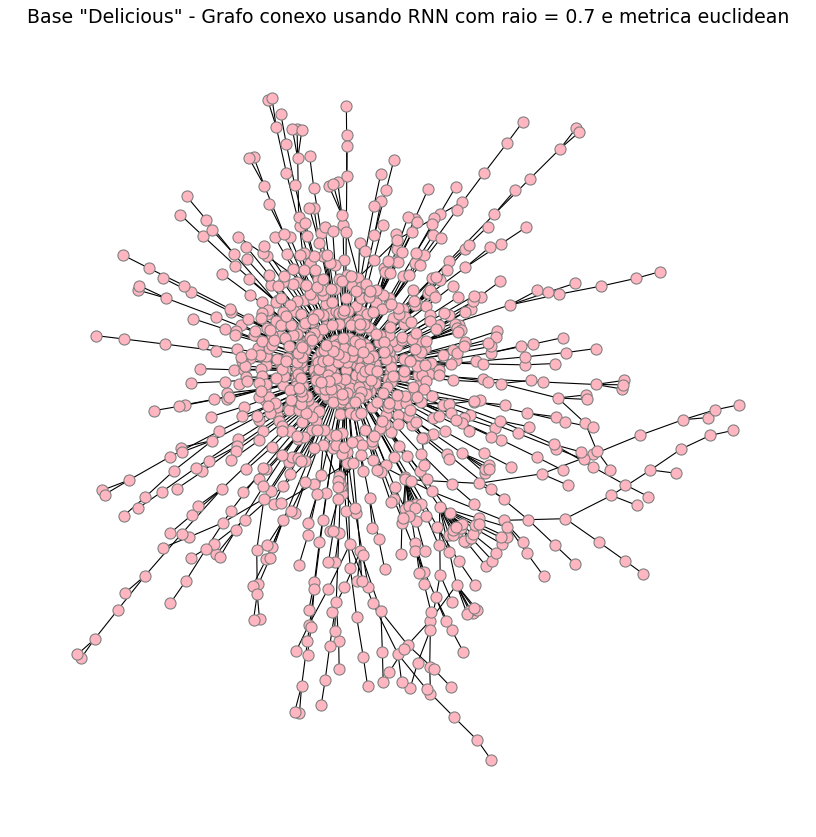

In [17]:
draw_conex_graph(0.7, "euclidean", "lightpink", mt_delicious)

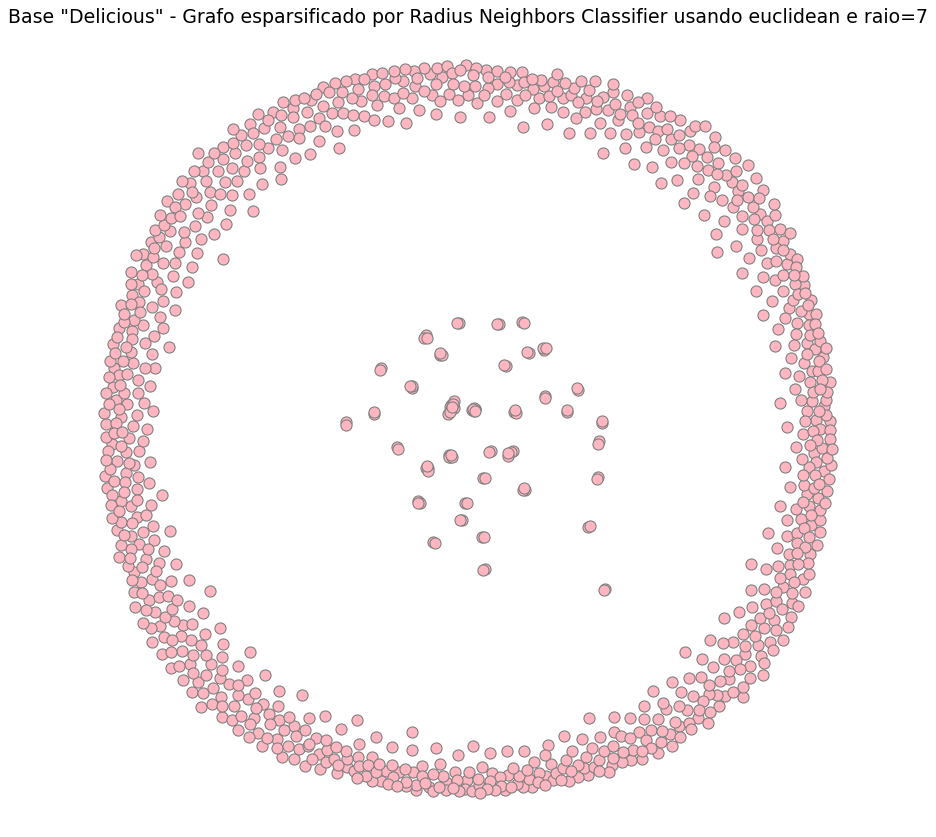

In [18]:
draw_rnc_graph(7,'euclidean', 'lightpink', mt_delicious)

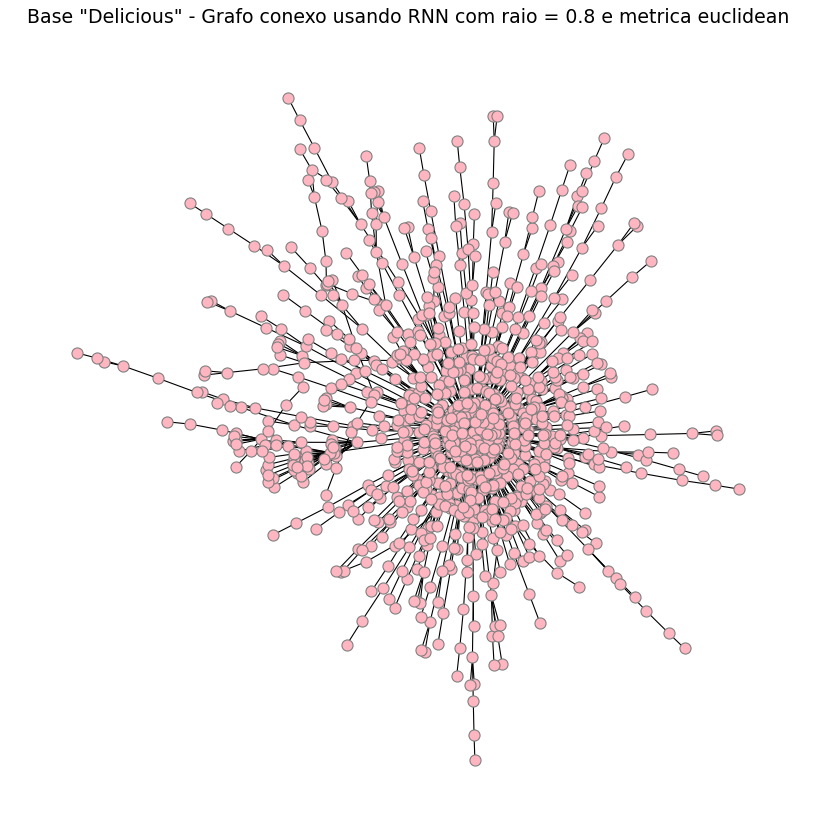

In [20]:
draw_conex_graph(mt_delicious, 0.8, 'euclidean', 'lightpink')

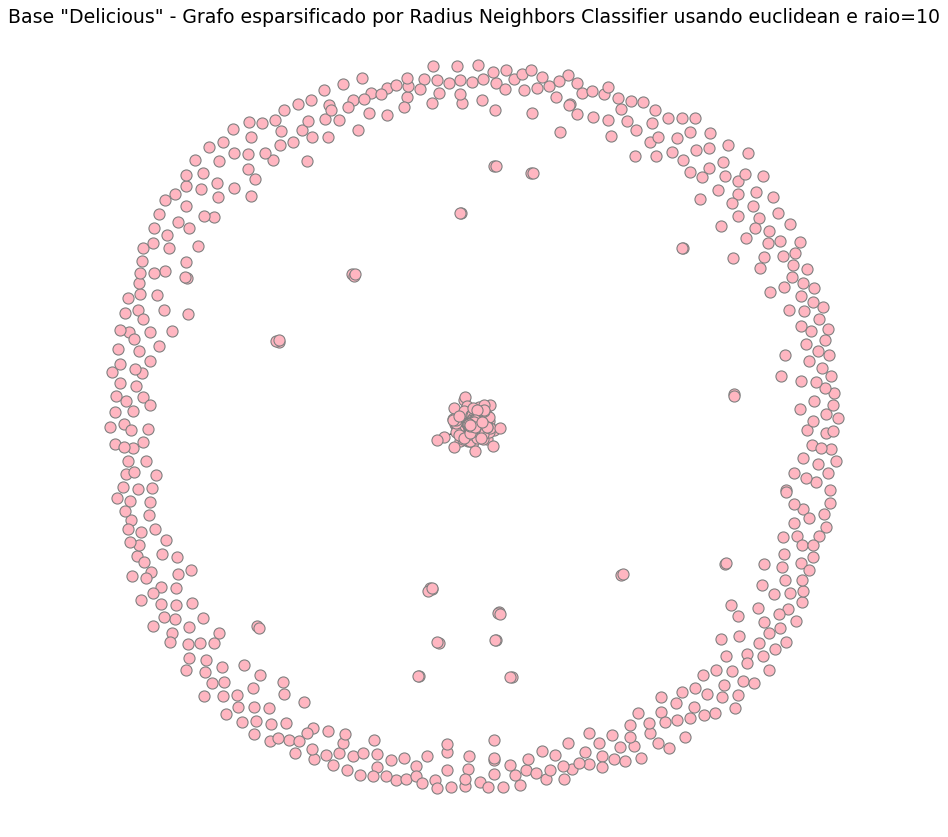

In [9]:
draw_rnc_graph(10,'euclidean', 'lightpink', mt_delicious)

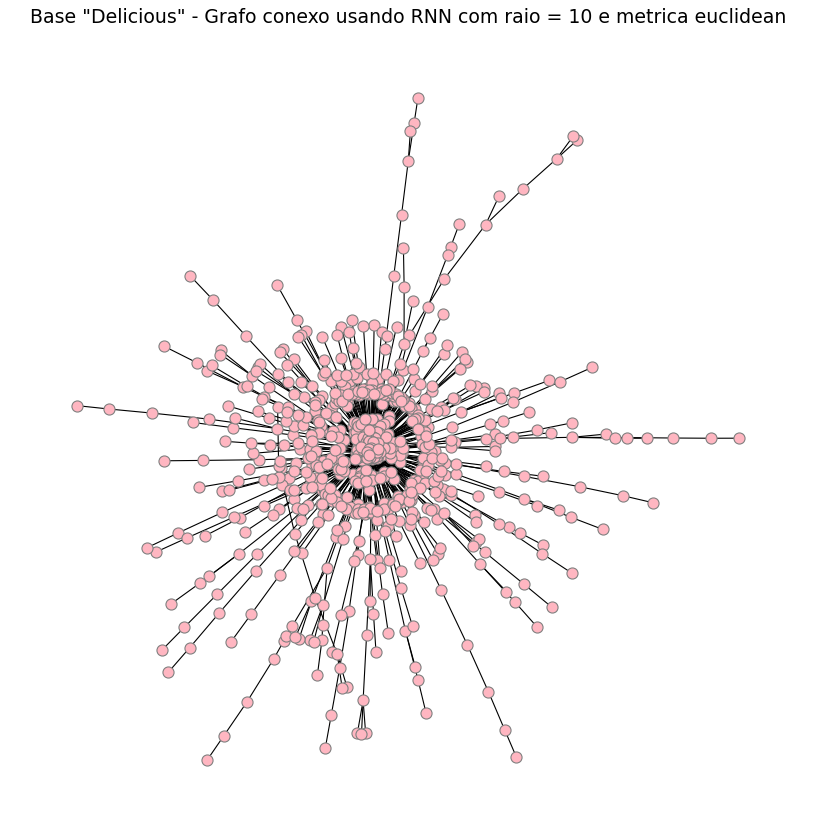

In [21]:
draw_conex_graph(mt_delicious, 10, 'euclidean', 'lightpink')

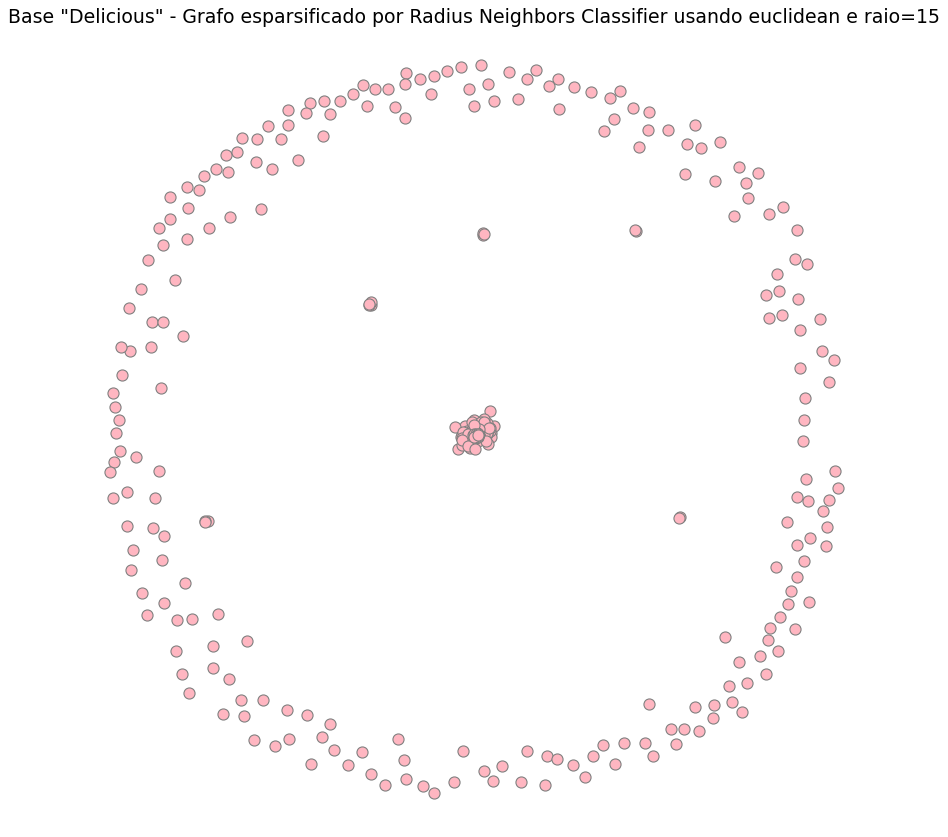

In [10]:
draw_rnc_graph(15,'euclidean', 'lightpink', mt_delicious)

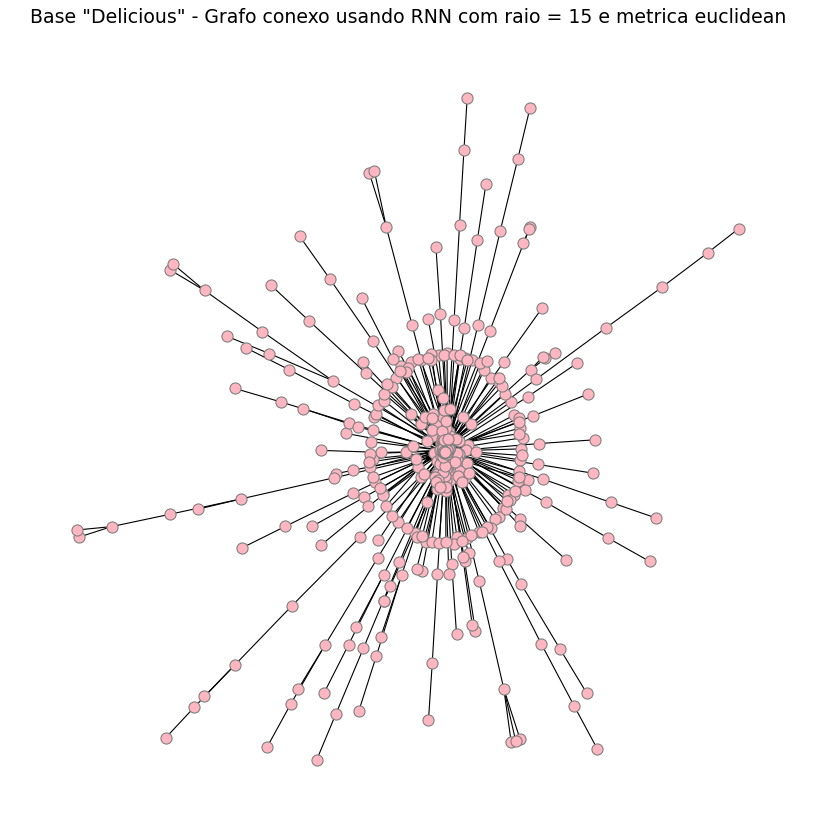

In [23]:
draw_conex_graph(mt_delicious, 15, 'euclidean', 'lightpink')

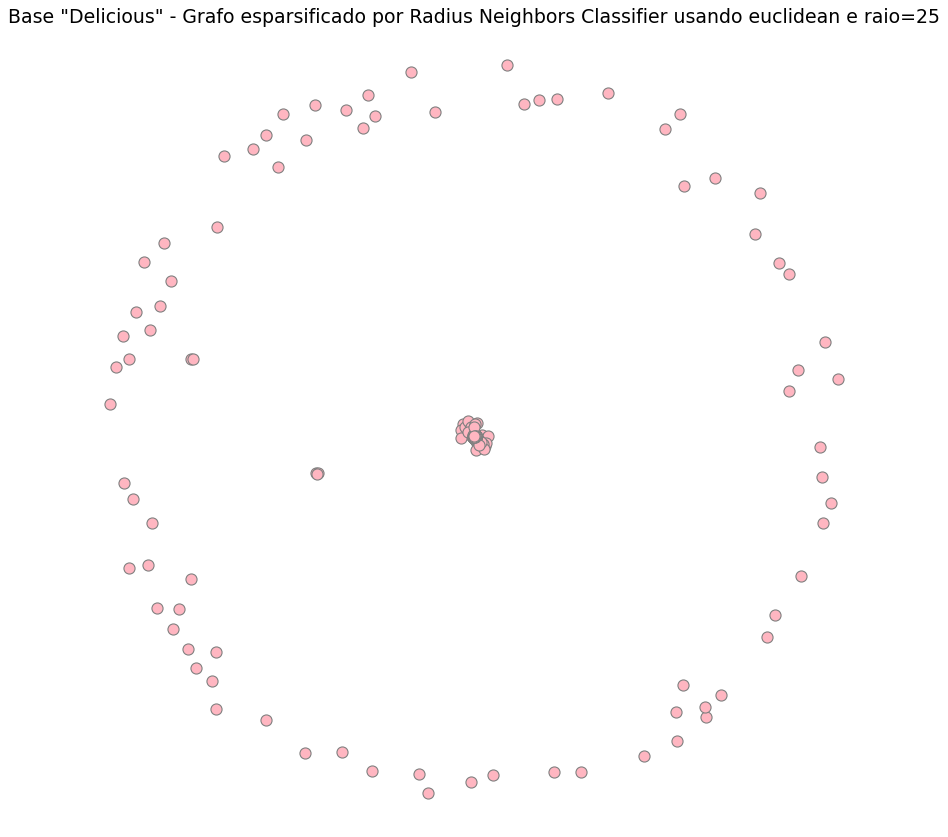

In [13]:
draw_rnc_graph(25,'euclidean', 'lightpink', mt_delicious)

## 2.2) Jaccard

#### Grafo completo e histograma

/home/julianapirolla/.local/lib/python3.10/site-packages/sklearn/metrics/pairwise.py:2025: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)


Minimum value in matrix: 0.0
Maximum value in matrix: 1.0


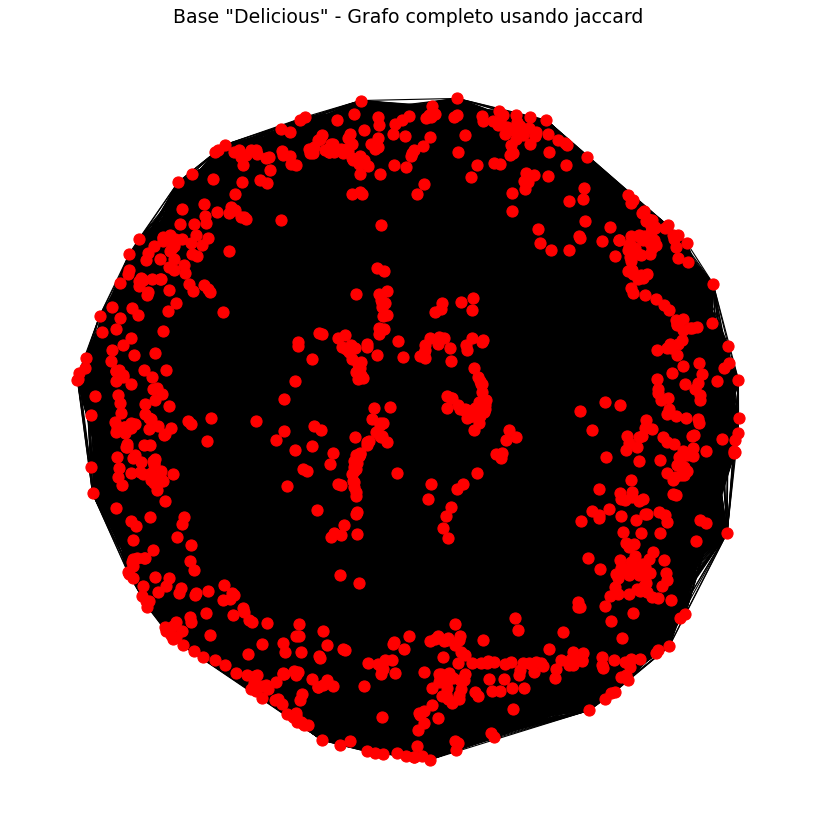

In [15]:
draw_graph('jaccard', 'Red', mt_delicious)

/home/julianapirolla/.local/lib/python3.10/site-packages/sklearn/metrics/pairwise.py:2025: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)


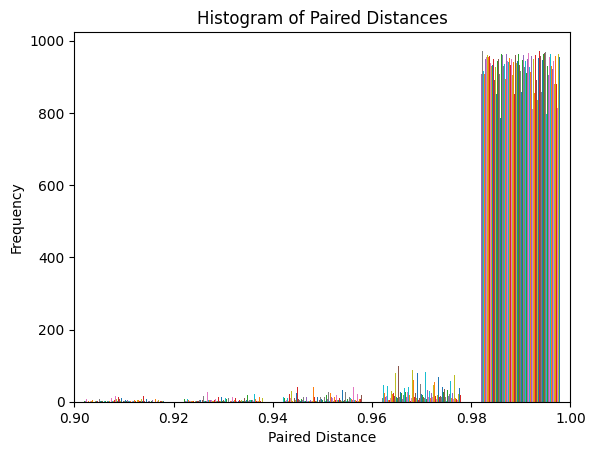

In [30]:
draw_histogram(mt_delicious, 'jaccard', 0.9, 1.0)

### Grafos esparsificados

##### 0.1 - 0.8

/home/julianapirolla/.local/lib/python3.10/site-packages/sklearn/metrics/pairwise.py:2025: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)


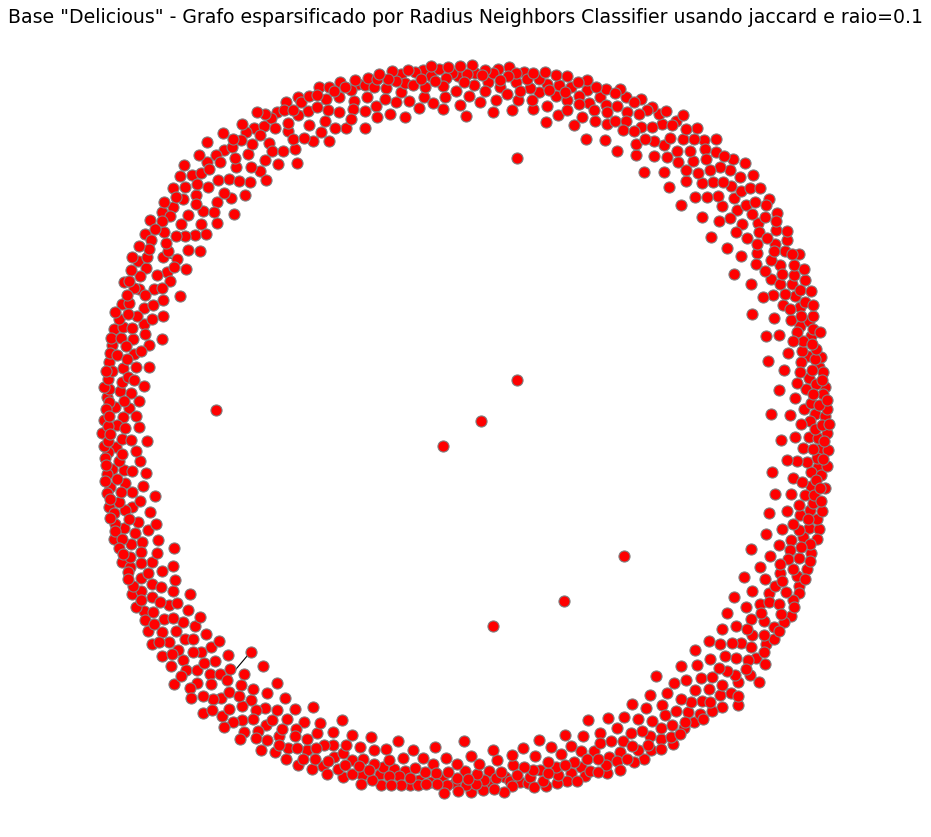

/home/julianapirolla/.local/lib/python3.10/site-packages/sklearn/metrics/pairwise.py:2025: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)


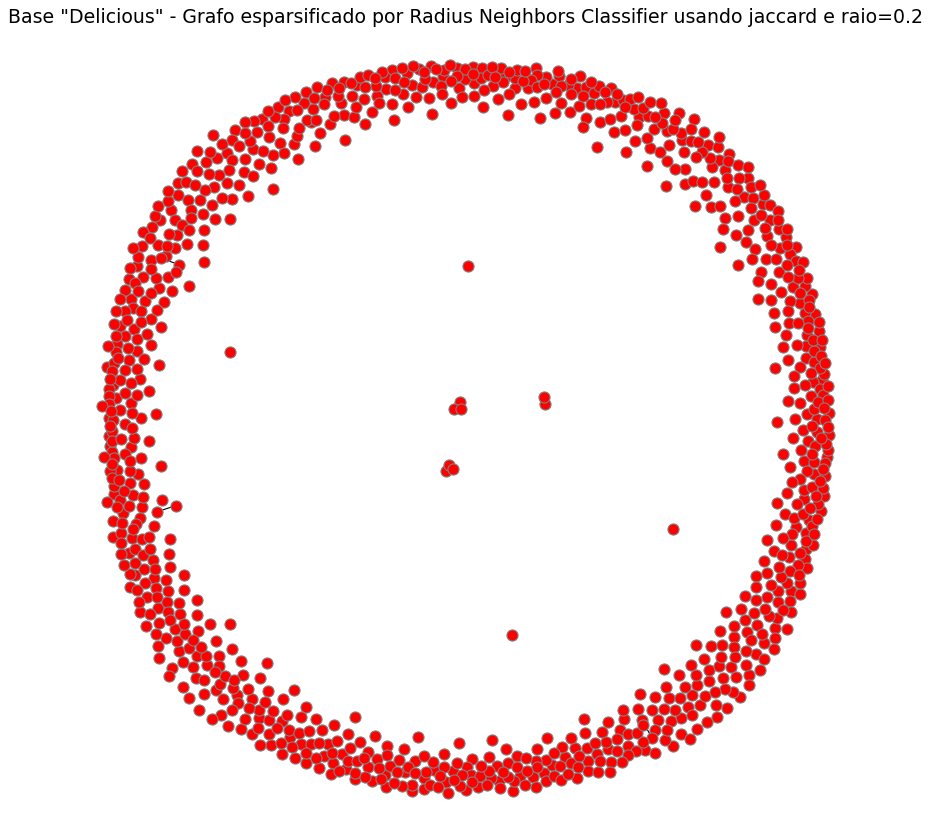

/home/julianapirolla/.local/lib/python3.10/site-packages/sklearn/metrics/pairwise.py:2025: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)


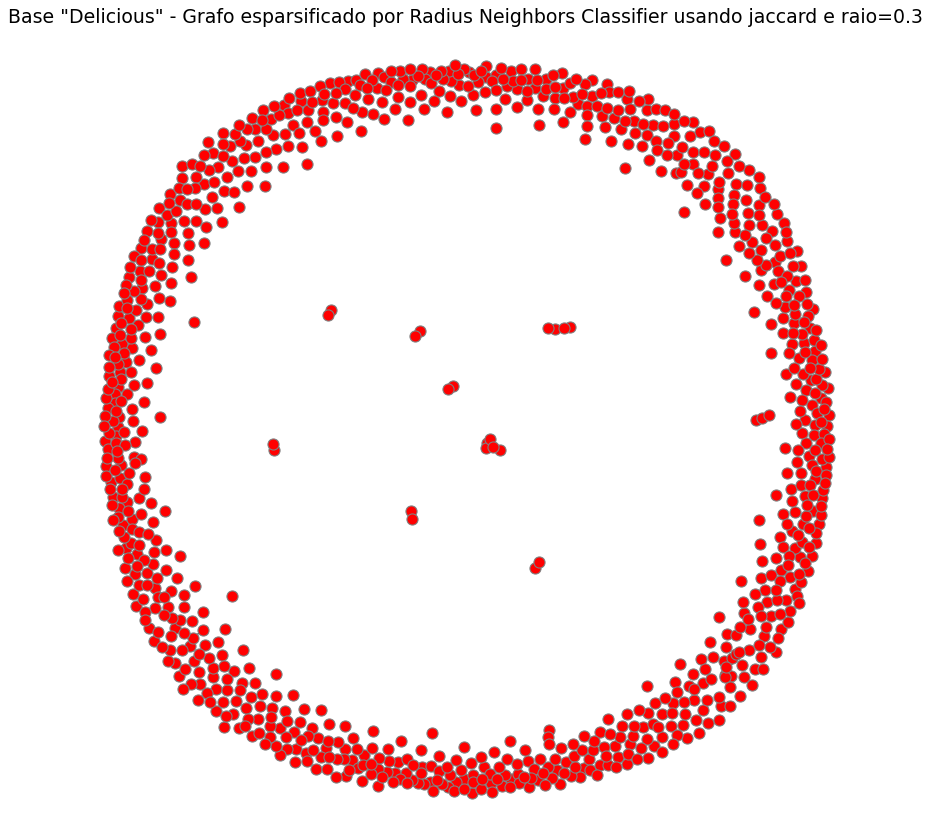

/home/julianapirolla/.local/lib/python3.10/site-packages/sklearn/metrics/pairwise.py:2025: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)


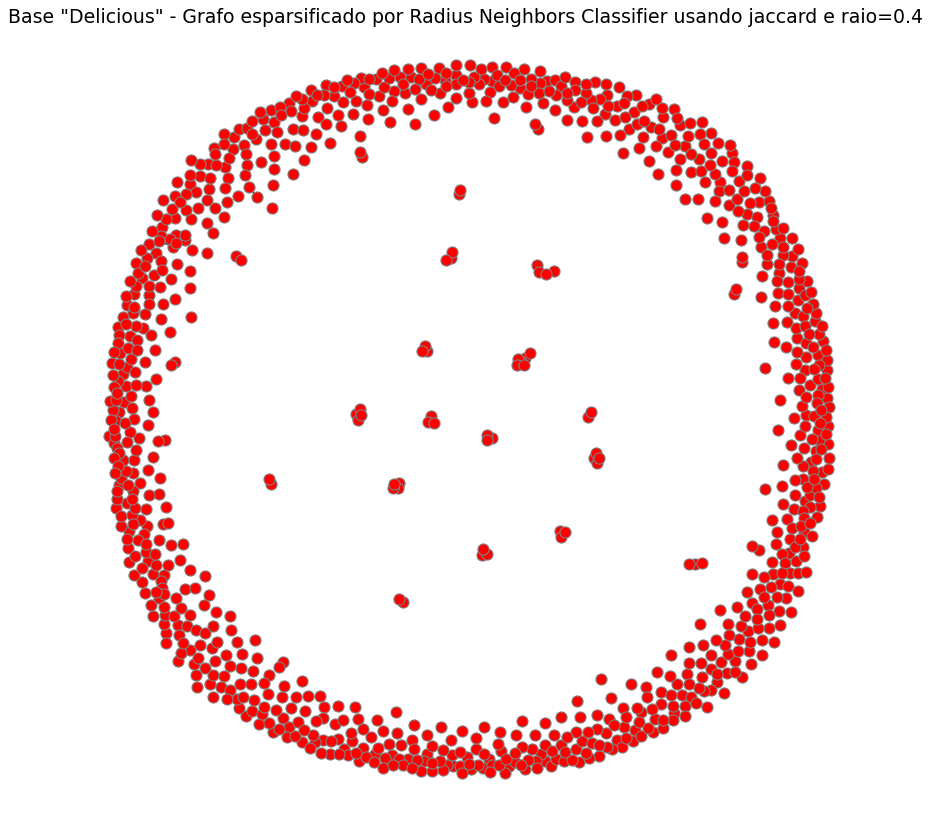

/home/julianapirolla/.local/lib/python3.10/site-packages/sklearn/metrics/pairwise.py:2025: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)


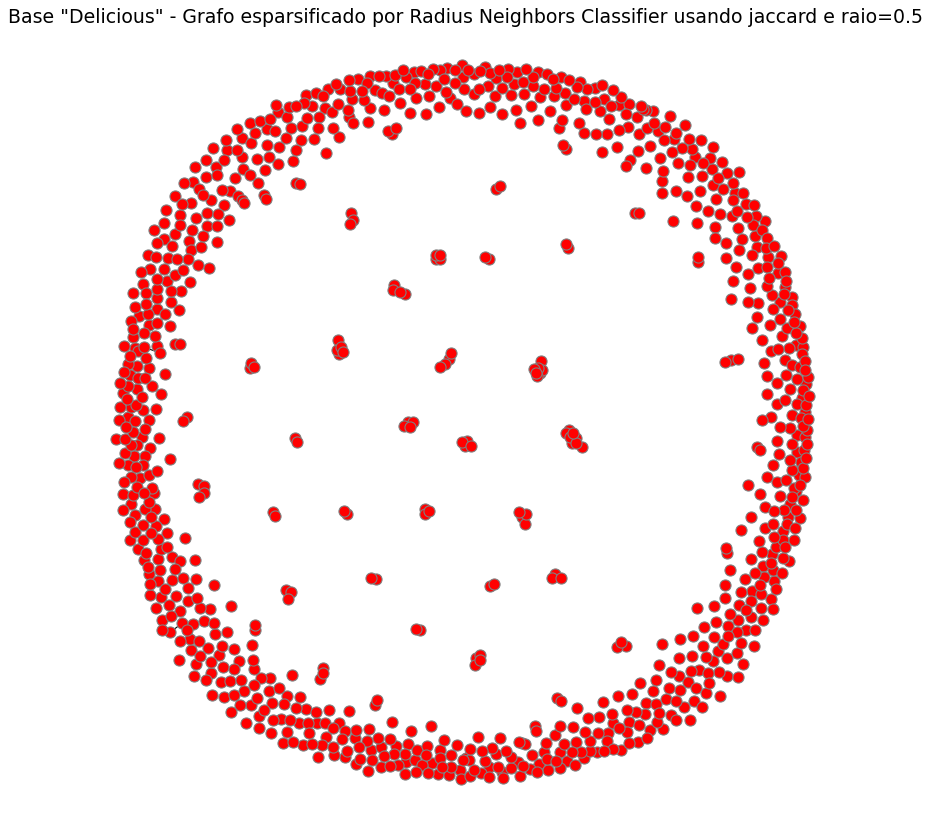

/home/julianapirolla/.local/lib/python3.10/site-packages/sklearn/metrics/pairwise.py:2025: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)


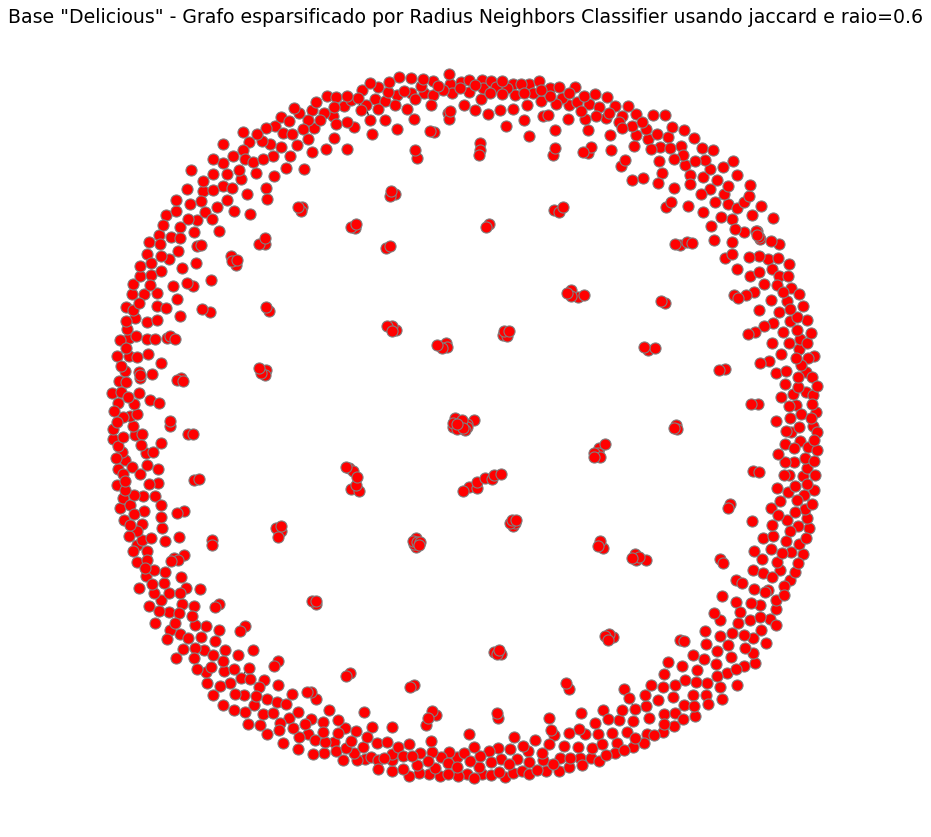

/home/julianapirolla/.local/lib/python3.10/site-packages/sklearn/metrics/pairwise.py:2025: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)


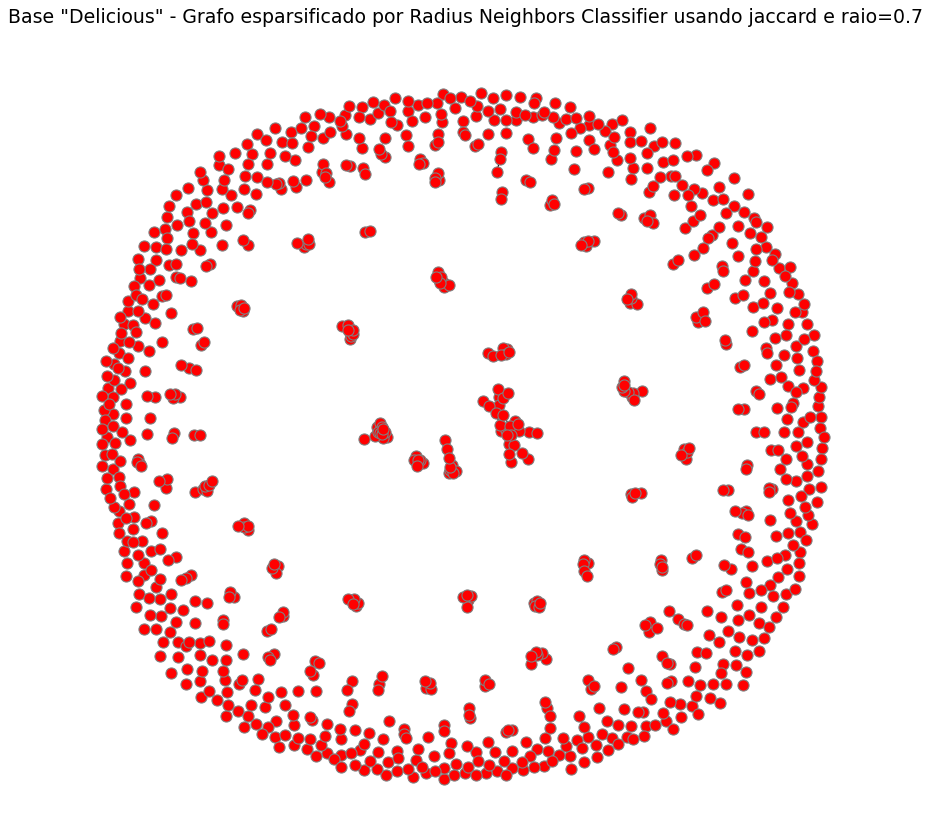

In [16]:
draw_rnc_graph(0.1, 'jaccard', 'red', mt_delicious)
draw_rnc_graph(0.2, 'jaccard', 'red', mt_delicious)
draw_rnc_graph(0.3, 'jaccard', 'red', mt_delicious)
draw_rnc_graph(0.4, 'jaccard', 'red', mt_delicious)
draw_rnc_graph(0.5, 'jaccard', 'red', mt_delicious)
draw_rnc_graph(0.6, 'jaccard', 'red', mt_delicious)
draw_rnc_graph(0.7, 'jaccard', 'red', mt_delicious)

##### 0.8 - 1.0

/home/julianapirolla/.local/lib/python3.10/site-packages/sklearn/metrics/pairwise.py:2025: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)


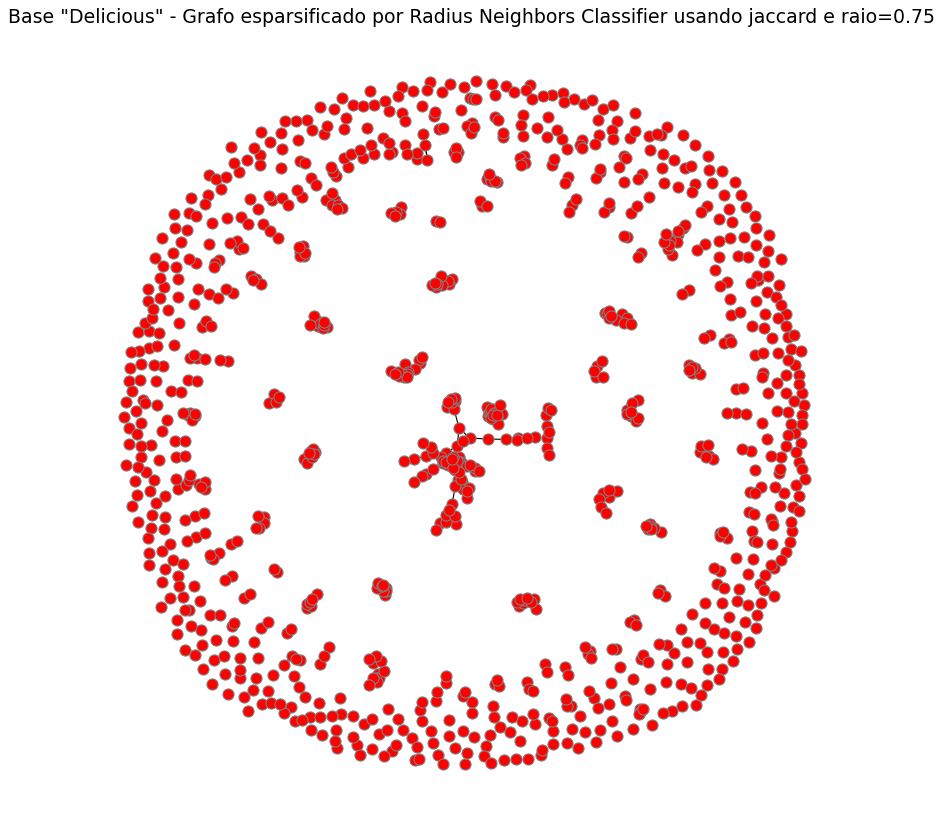

/home/julianapirolla/.local/lib/python3.10/site-packages/sklearn/metrics/pairwise.py:2025: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)


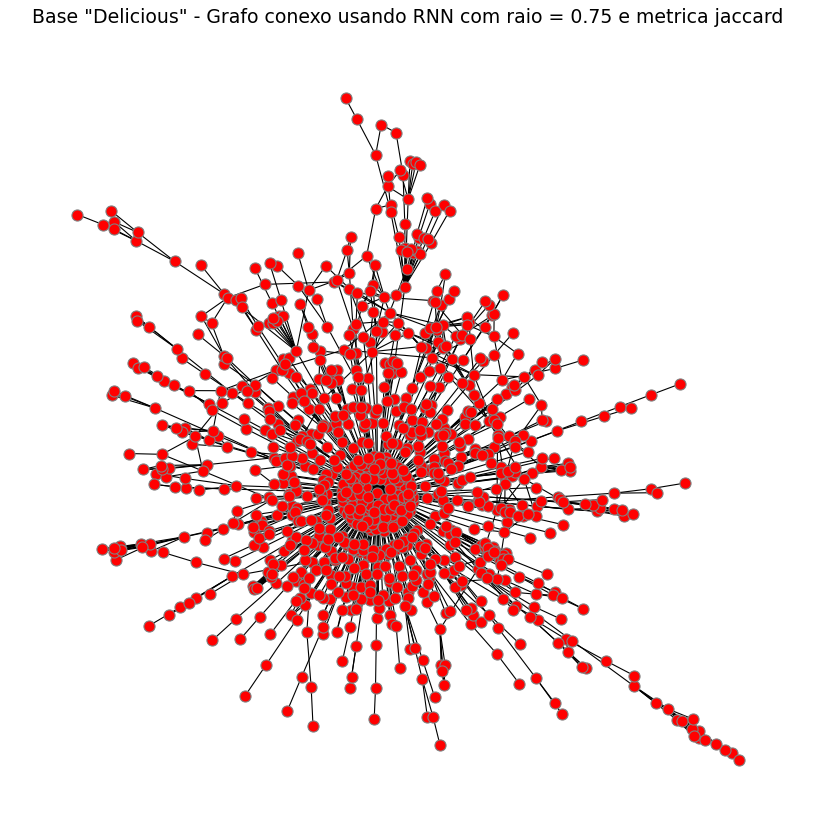

In [13]:
draw_rnc_graph(0.75, 'jaccard', 'red', mt_delicious)
draw_conex_graph(mt_delicious, 0.75, 'jaccard', 'red')


/home/julianapirolla/.local/lib/python3.10/site-packages/sklearn/metrics/pairwise.py:2025: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)


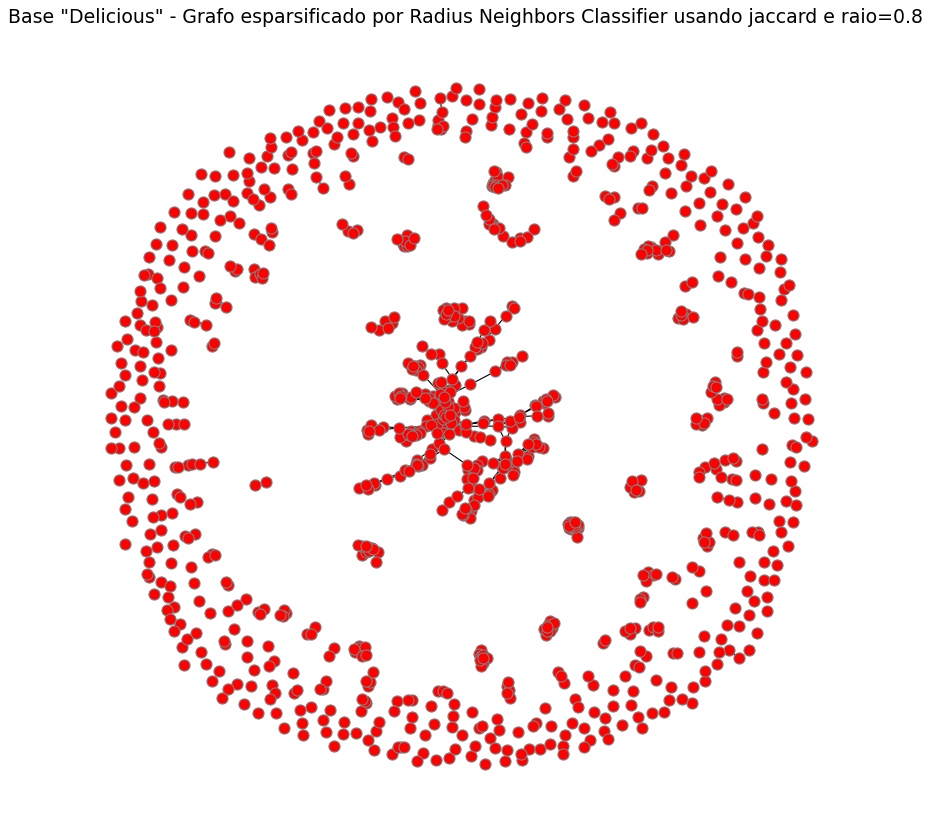

/home/julianapirolla/.local/lib/python3.10/site-packages/sklearn/metrics/pairwise.py:2025: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)


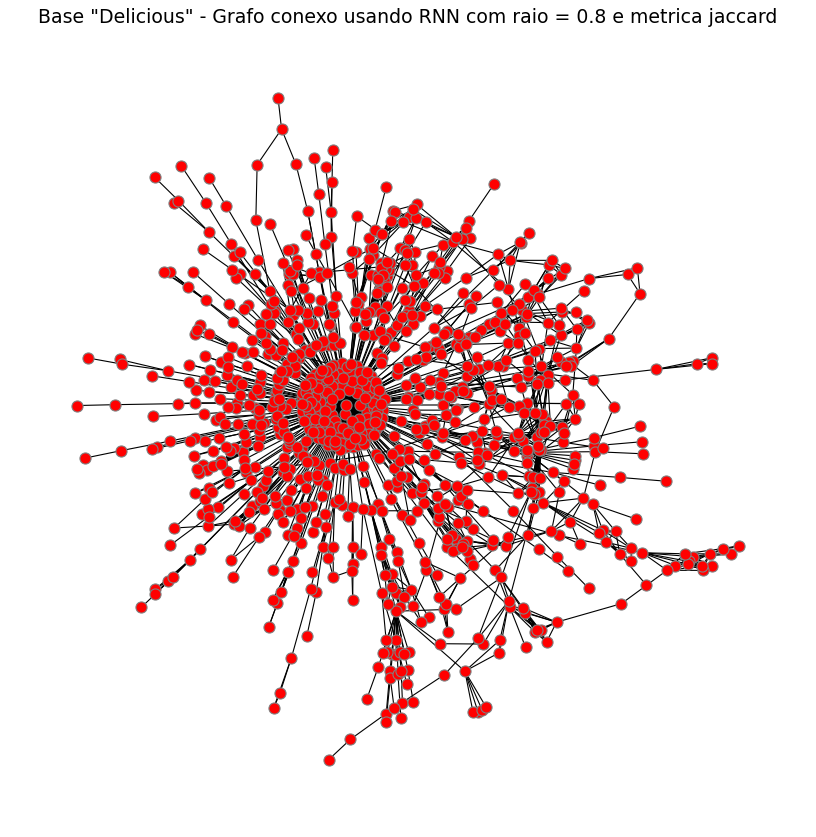

In [10]:
draw_rnc_graph(0.8, 'jaccard', 'red', mt_delicious)
draw_conex_graph(mt_delicious, 0.8, 'jaccard', 'red')

/home/julianapirolla/.local/lib/python3.10/site-packages/sklearn/metrics/pairwise.py:2025: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)


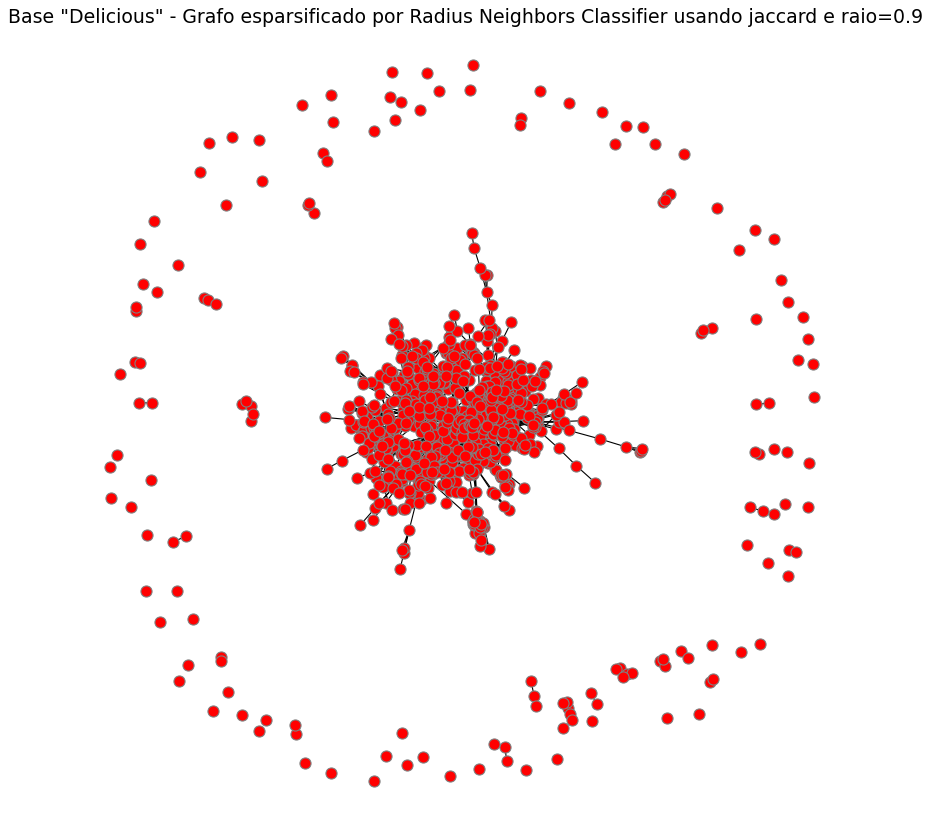

/home/julianapirolla/.local/lib/python3.10/site-packages/sklearn/metrics/pairwise.py:2025: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)


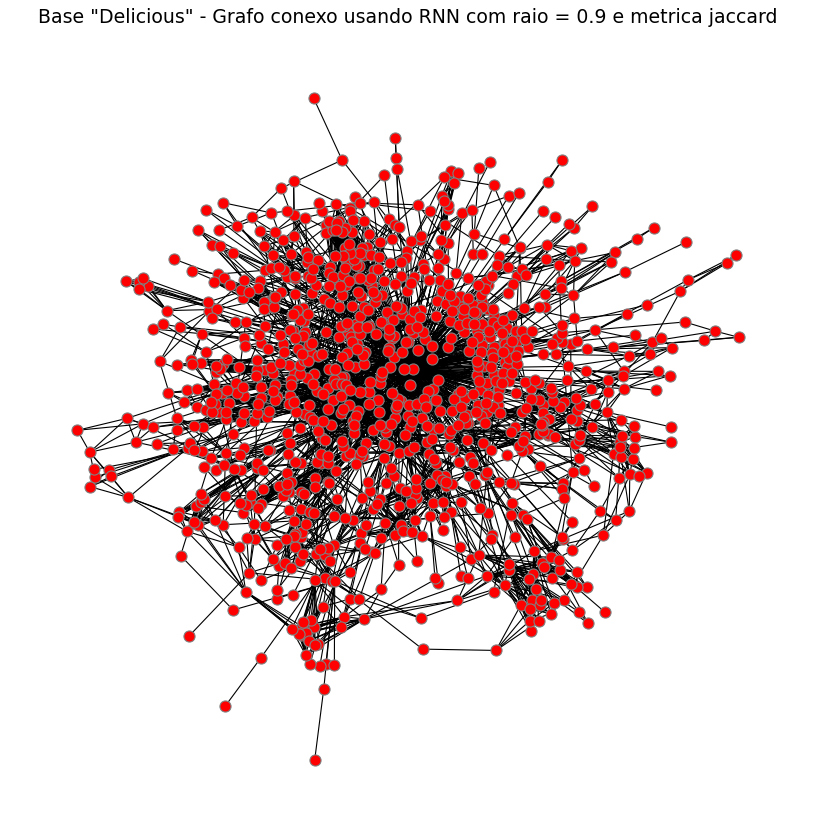

In [11]:
draw_rnc_graph(0.9, 'jaccard', 'red', mt_delicious)
draw_conex_graph(mt_delicious, 0.9 , 'jaccard',  'red')

/home/julianapirolla/.local/lib/python3.10/site-packages/sklearn/metrics/pairwise.py:2025: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)


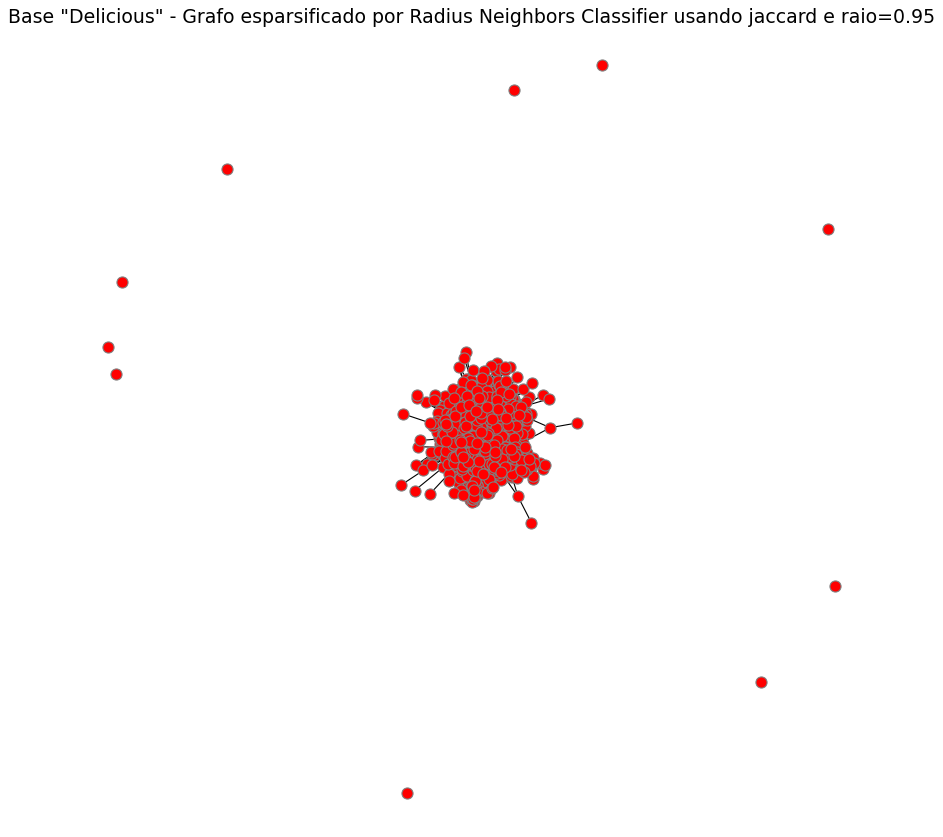

/home/julianapirolla/.local/lib/python3.10/site-packages/sklearn/metrics/pairwise.py:2025: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)


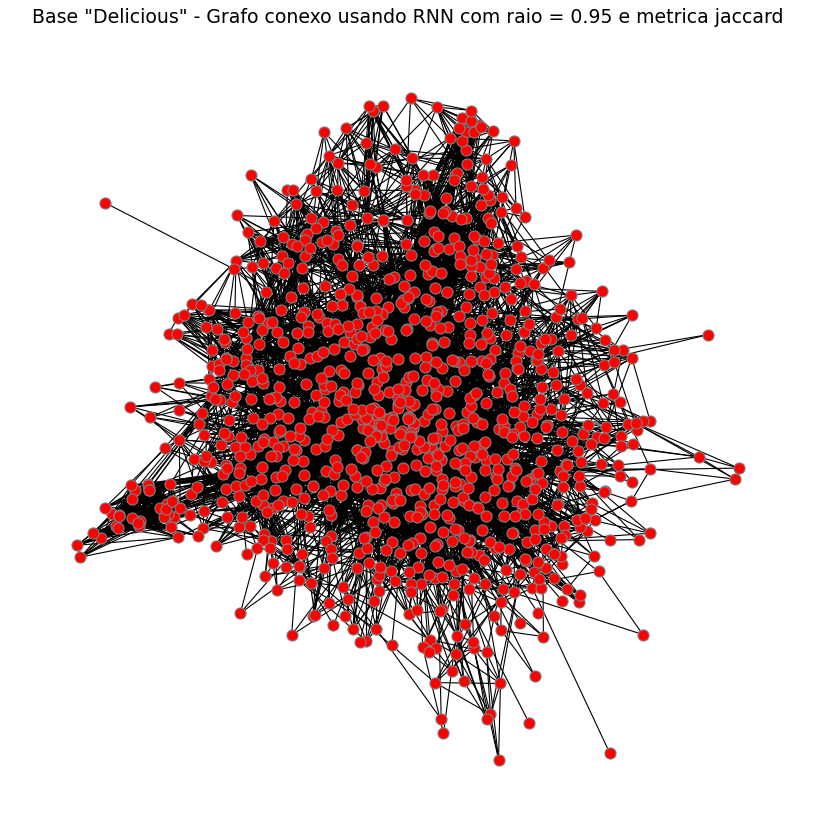

In [12]:
draw_rnc_graph(0.95, 'jaccard', 'red', mt_delicious)
draw_conex_graph(mt_delicious, 0.95, 'jaccard', 'red')

## 2.3) Rogers Tanimoto 

#### Grafo completo e histograma

/home/julianapirolla/.local/lib/python3.10/site-packages/sklearn/metrics/pairwise.py:2025: DataConversionWarning: Data was converted to boolean for metric rogerstanimoto
  warnings.warn(msg, DataConversionWarning)


Minimum value in matrix: 0.0
Maximum value in matrix: 0.6506639855892087


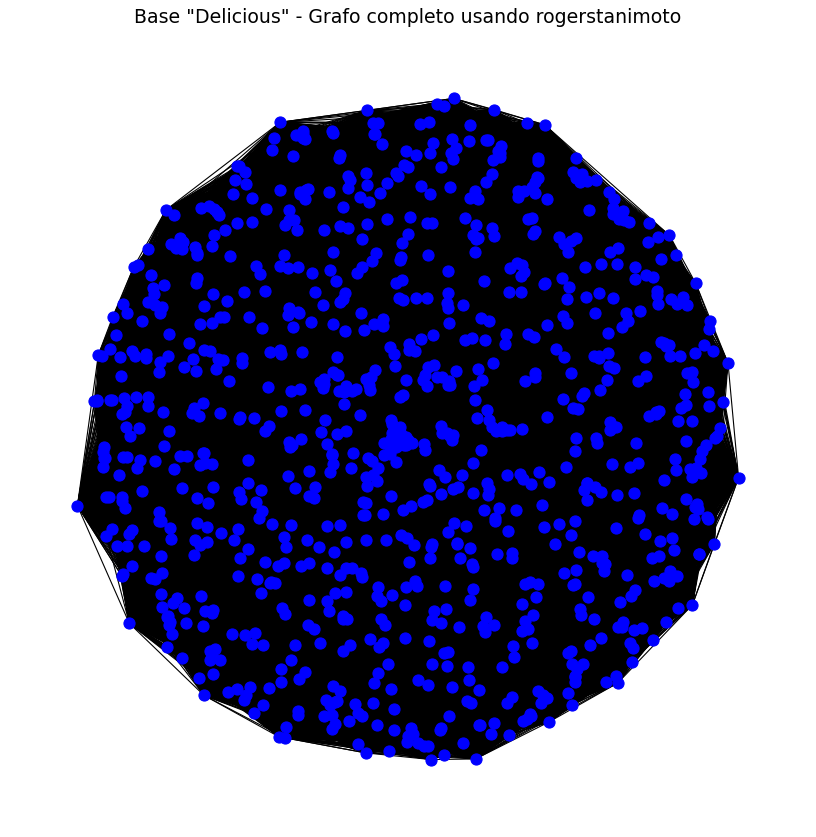

In [6]:
draw_graph('rogerstanimoto', 'blue', mt_delicious)

/home/julianapirolla/.local/lib/python3.10/site-packages/sklearn/metrics/pairwise.py:2025: DataConversionWarning: Data was converted to boolean for metric rogerstanimoto
  warnings.warn(msg, DataConversionWarning)


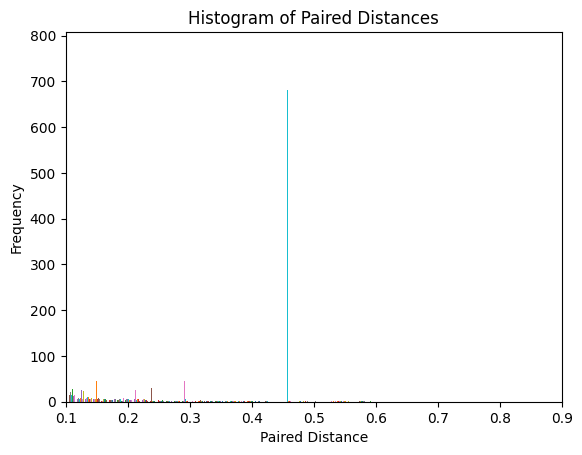

In [7]:
    draw_histogram(mt_delicious, 'rogerstanimoto', 0.1, 0.9)

/home/julianapirolla/.local/lib/python3.10/site-packages/sklearn/metrics/pairwise.py:2025: DataConversionWarning: Data was converted to boolean for metric rogerstanimoto
  warnings.warn(msg, DataConversionWarning)


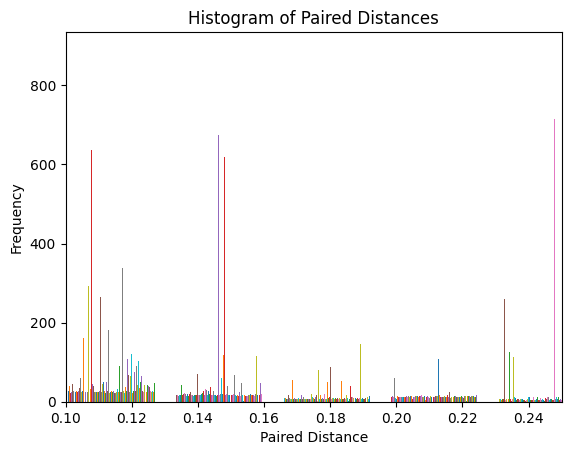

In [18]:
draw_histogram(mt_delicious, 'rogerstanimoto', 0.1, 0.25)

#### Grafos esparsificados

##### 0.11 - 0.15

/home/julianapirolla/.local/lib/python3.10/site-packages/sklearn/metrics/pairwise.py:2025: DataConversionWarning: Data was converted to boolean for metric rogerstanimoto
  warnings.warn(msg, DataConversionWarning)


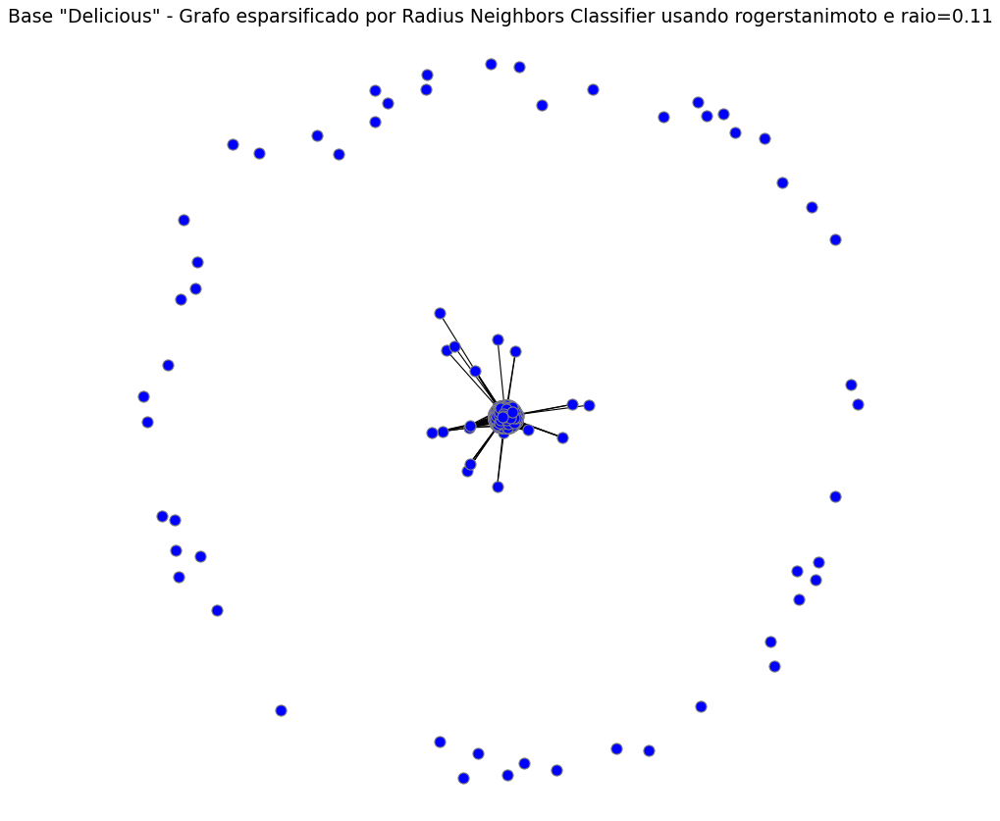

/home/julianapirolla/.local/lib/python3.10/site-packages/sklearn/metrics/pairwise.py:2025: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)


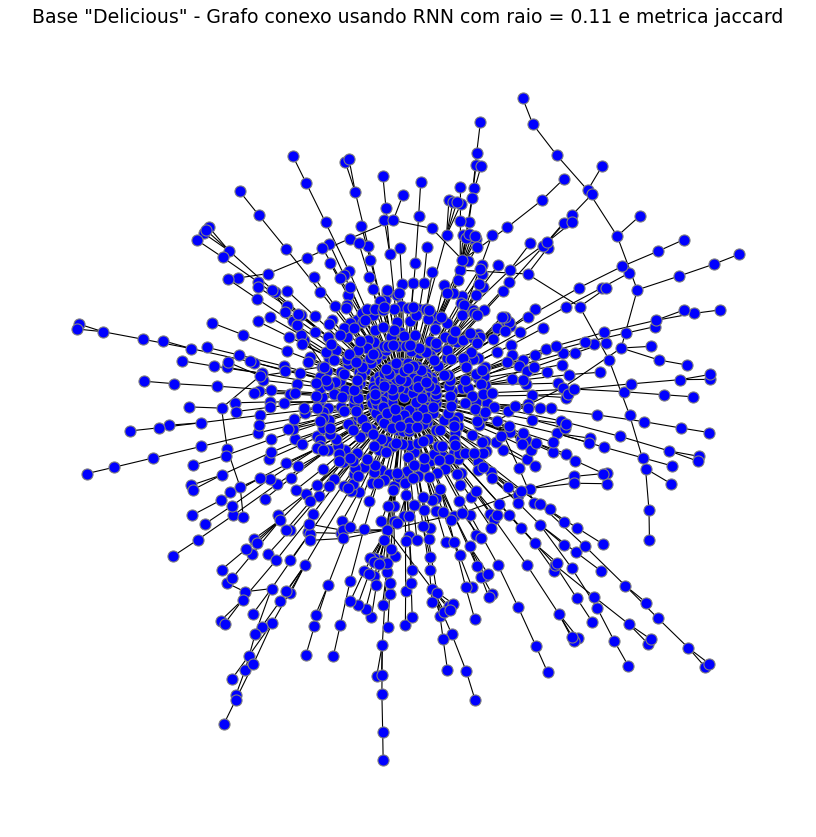

In [15]:
draw_rnc_graph(0.11,'rogerstanimoto', 'Blue', mt_delicious)
draw_conex_graph( 0.11, 'jaccard',  'Blue', mt_delicious)

/home/julianapirolla/.local/lib/python3.10/site-packages/sklearn/metrics/pairwise.py:2025: DataConversionWarning: Data was converted to boolean for metric rogerstanimoto
  warnings.warn(msg, DataConversionWarning)


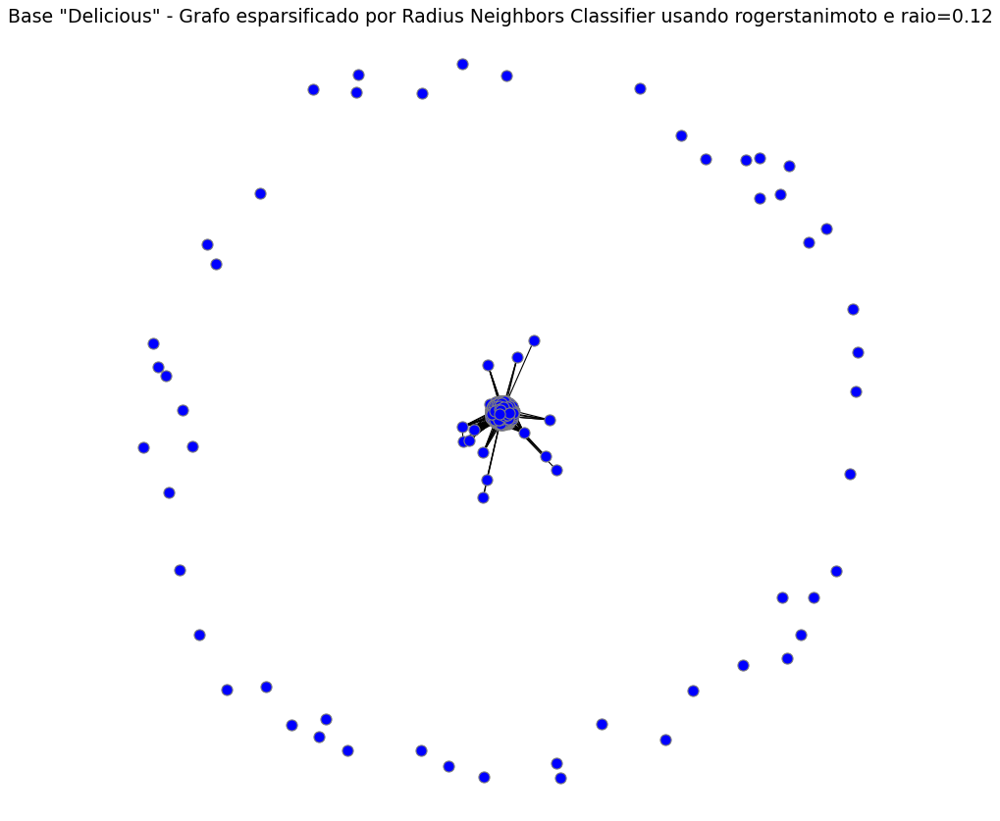

/home/julianapirolla/.local/lib/python3.10/site-packages/sklearn/metrics/pairwise.py:2025: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)


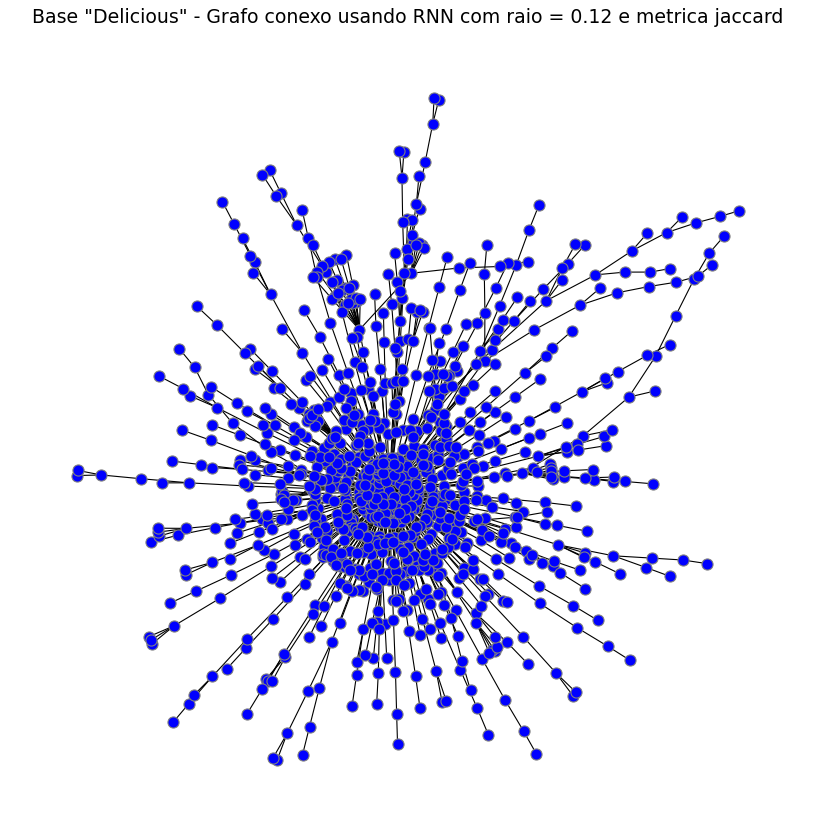

In [16]:
draw_rnc_graph(0.12,'rogerstanimoto', 'Blue', mt_delicious)
draw_conex_graph( 0.12, 'jaccard',  'Blue', mt_delicious)

/home/julianapirolla/.local/lib/python3.10/site-packages/sklearn/metrics/pairwise.py:2025: DataConversionWarning: Data was converted to boolean for metric rogerstanimoto
  warnings.warn(msg, DataConversionWarning)


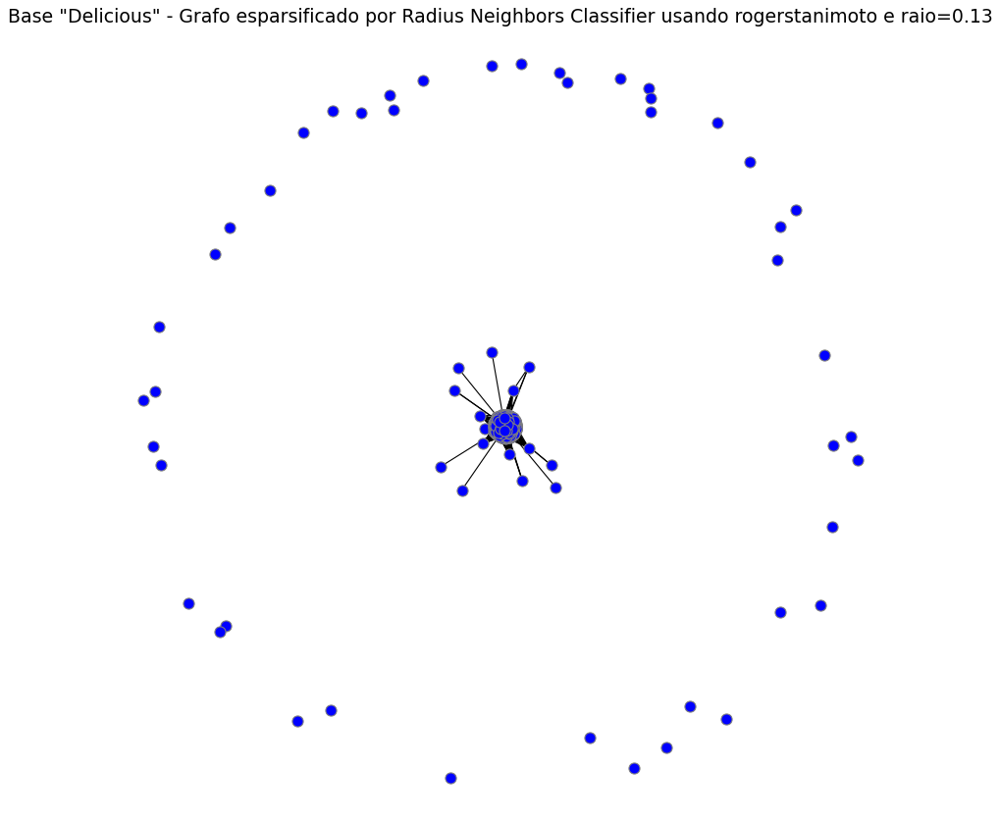

/home/julianapirolla/.local/lib/python3.10/site-packages/sklearn/metrics/pairwise.py:2025: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)


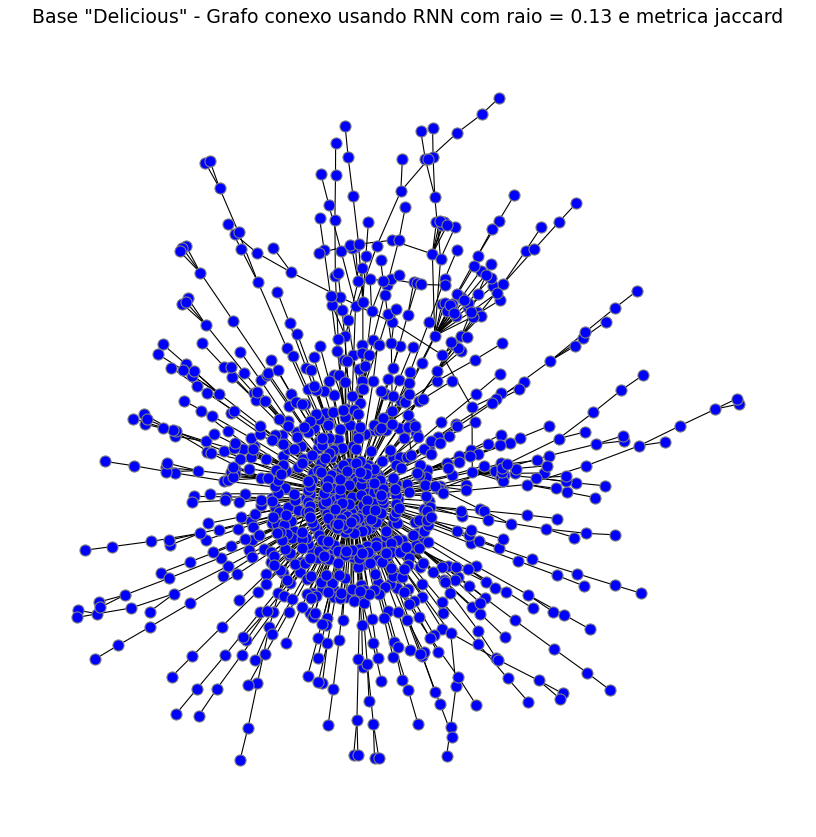

In [17]:
draw_rnc_graph(0.13,'rogerstanimoto', 'Blue', mt_delicious)
draw_conex_graph( 0.13, 'jaccard',  'Blue', mt_delicious)

/home/julianapirolla/.local/lib/python3.10/site-packages/sklearn/metrics/pairwise.py:2025: DataConversionWarning: Data was converted to boolean for metric rogerstanimoto
  warnings.warn(msg, DataConversionWarning)


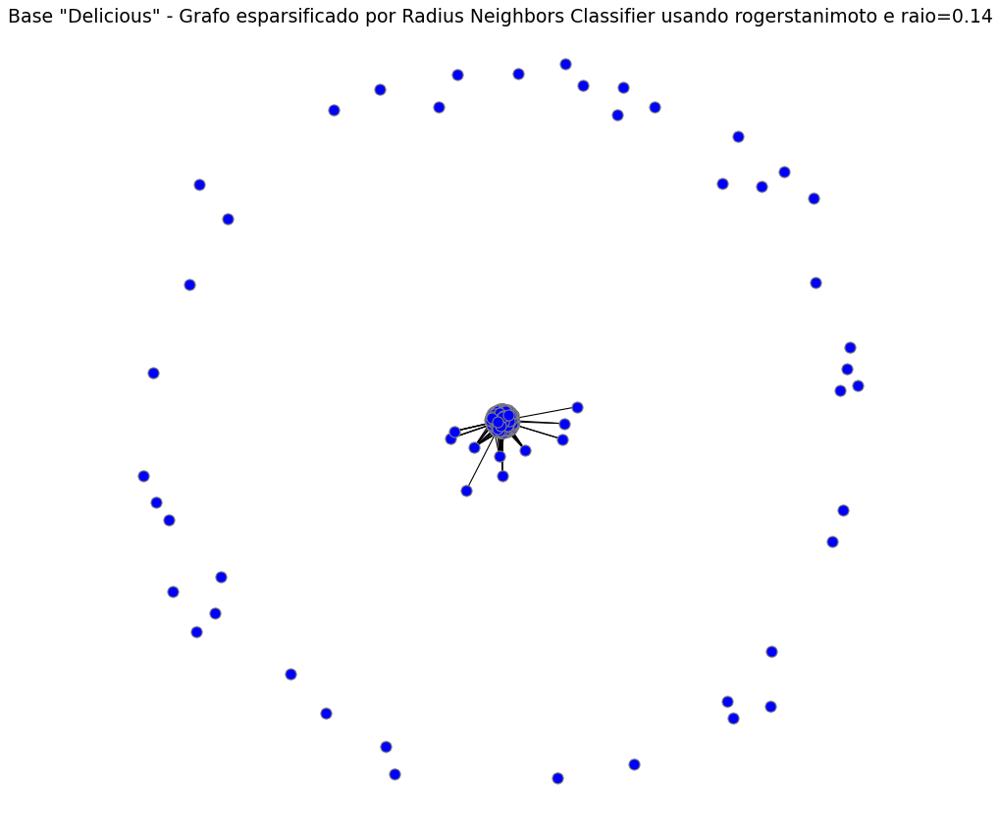

/home/julianapirolla/.local/lib/python3.10/site-packages/sklearn/metrics/pairwise.py:2025: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)


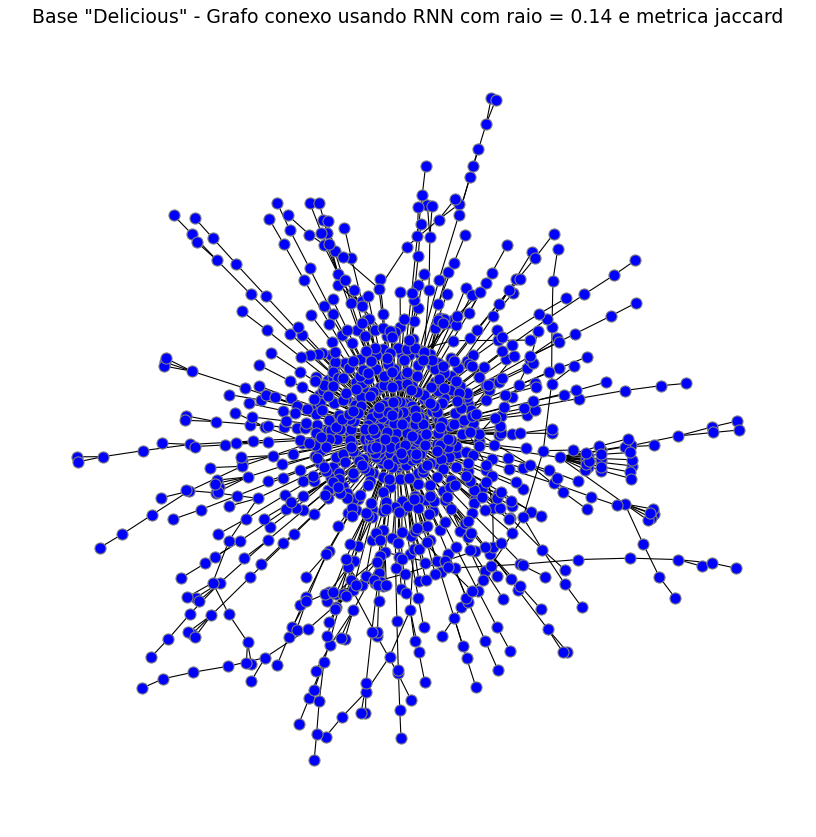

In [18]:
draw_rnc_graph(0.14,'rogerstanimoto', 'Blue', mt_delicious)
draw_conex_graph( 0.14, 'jaccard',  'Blue', mt_delicious)

/home/julianapirolla/.local/lib/python3.10/site-packages/sklearn/metrics/pairwise.py:2025: DataConversionWarning: Data was converted to boolean for metric rogerstanimoto
  warnings.warn(msg, DataConversionWarning)


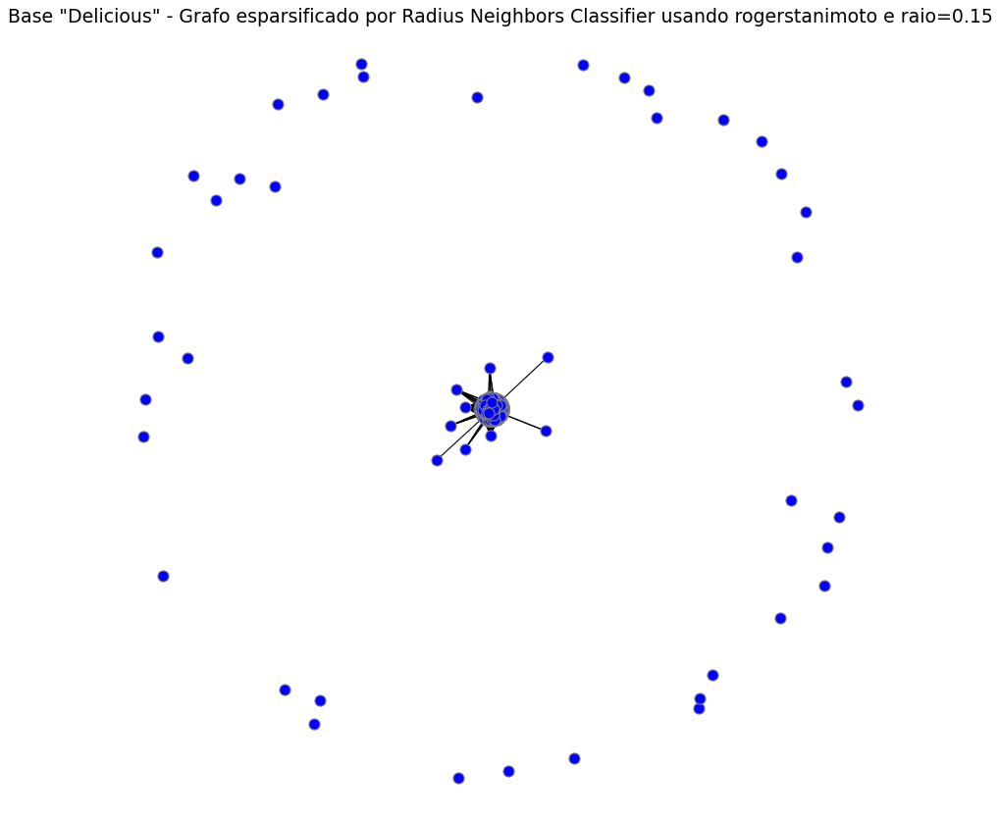

/home/julianapirolla/.local/lib/python3.10/site-packages/sklearn/metrics/pairwise.py:2025: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)


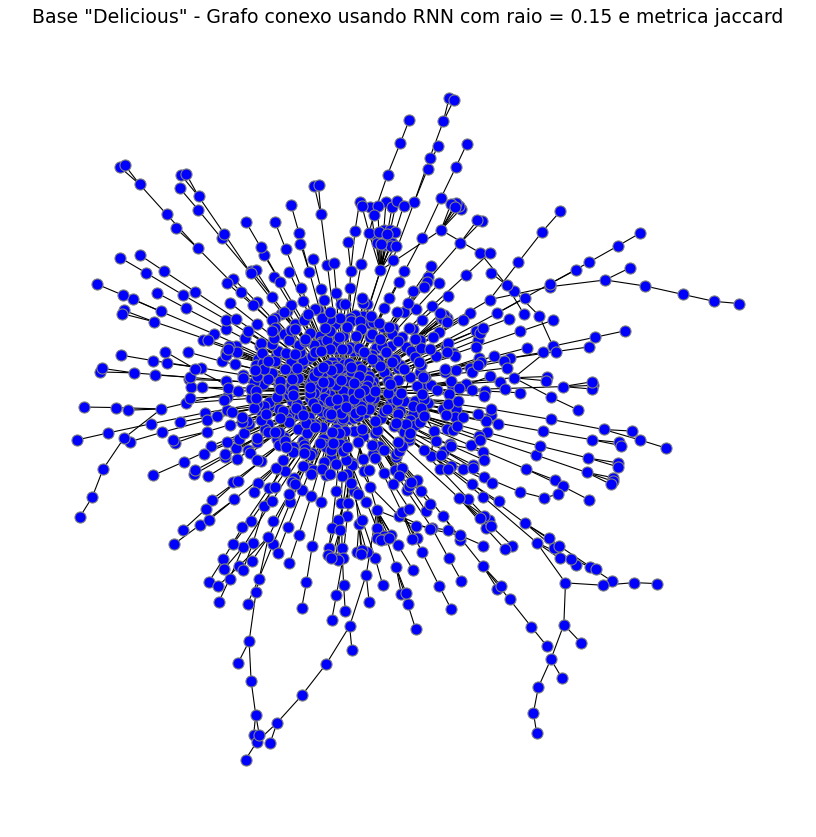

In [20]:
draw_rnc_graph(0.15,'rogerstanimoto', 'Blue', mt_delicious)
draw_conex_graph( 0.15, 'jaccard',  'Blue', mt_delicious)

##### 0.18 - 0.24

/home/julianapirolla/.local/lib/python3.10/site-packages/sklearn/metrics/pairwise.py:2025: DataConversionWarning: Data was converted to boolean for metric rogerstanimoto
  warnings.warn(msg, DataConversionWarning)


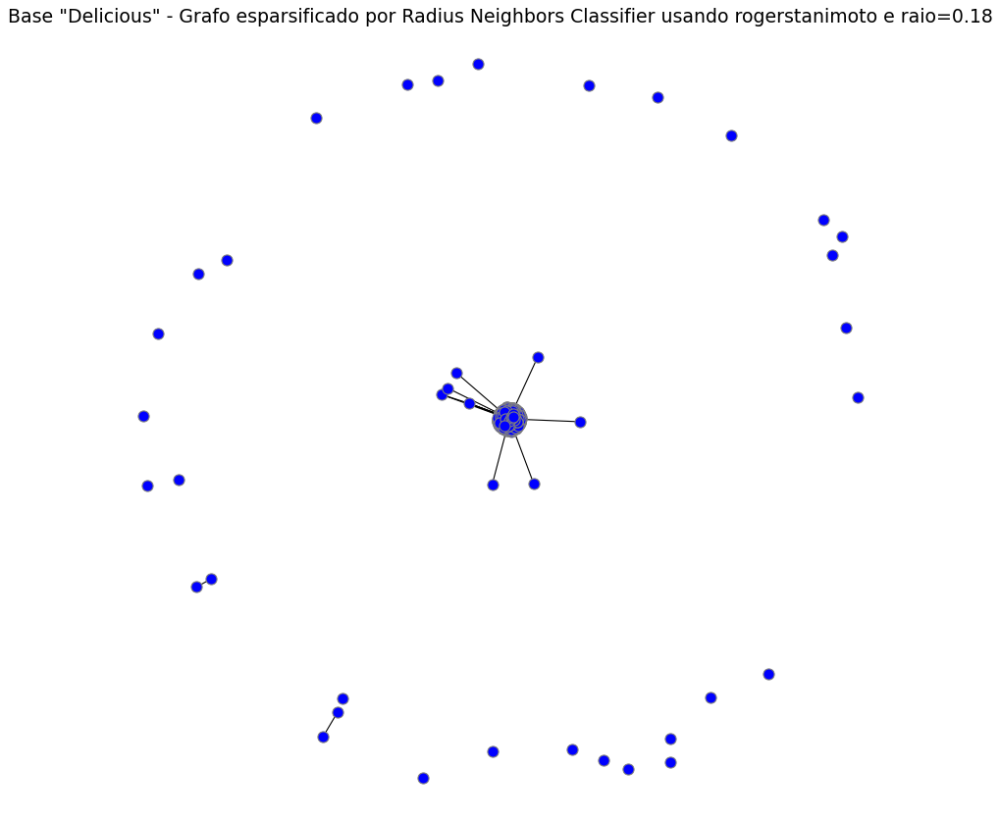

/home/julianapirolla/.local/lib/python3.10/site-packages/sklearn/metrics/pairwise.py:2025: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)


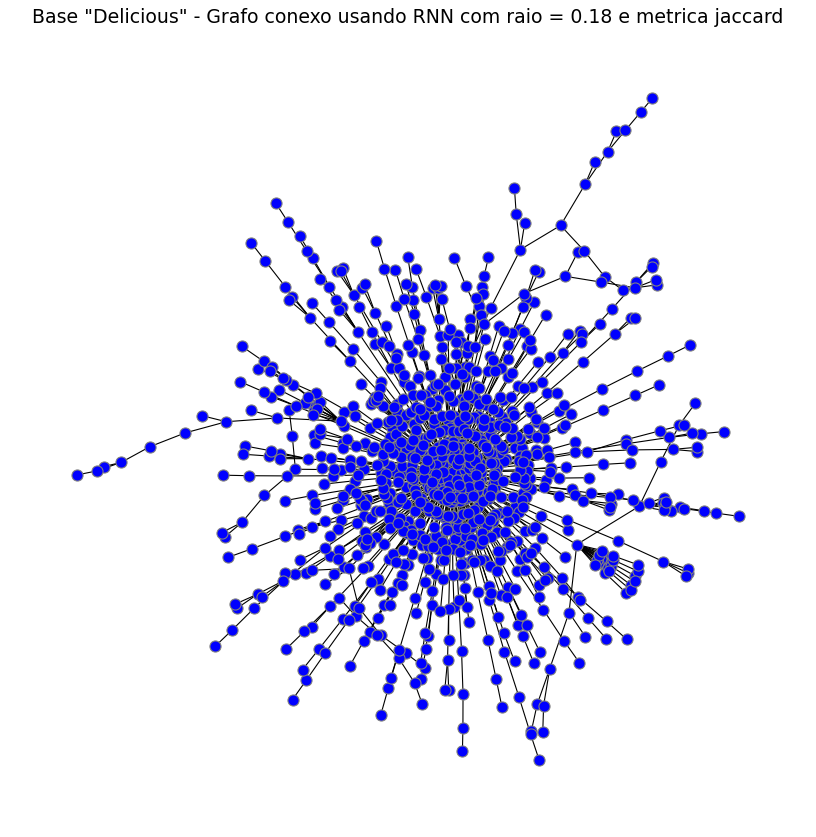

In [21]:
draw_rnc_graph(0.18,'rogerstanimoto', 'Blue', mt_delicious)
draw_conex_graph( 0.18, 'jaccard',  'Blue', mt_delicious)


In [ ]:
draw_rnc_graph(0.21,'rogerstanimoto', 'Blue', mt_delicious)
draw_conex_graph( 0.21, 'jaccard',  'Blue', mt_delicious)


In [ ]:
draw_rnc_graph(0.24,'rogerstanimoto', 'Blue', mt_delicious)
draw_conex_graph( 0.24, 'jaccard',  'Blue', mt_delicious)

#### Grafo completo e histograma

## 2.5) Minkowski - verificar 

#### Grafo completo e histograma

Minimum value in matrix: 0.0
Maximum value in matrix: 88.12491134747314


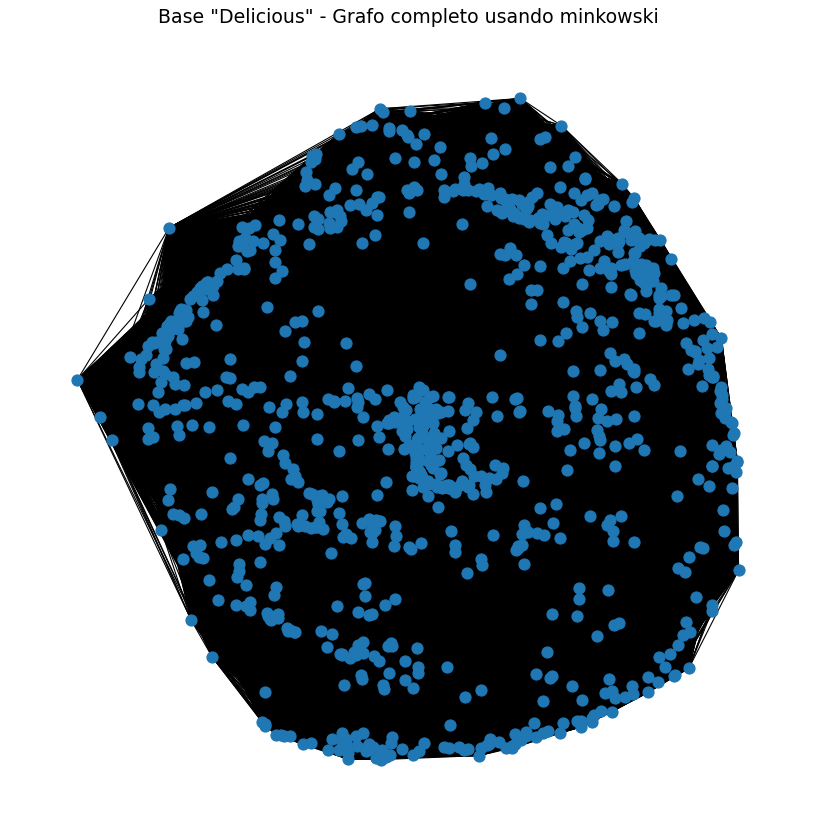

In [7]:
draw_graph('minkowski', 'C0', mt_delicious)

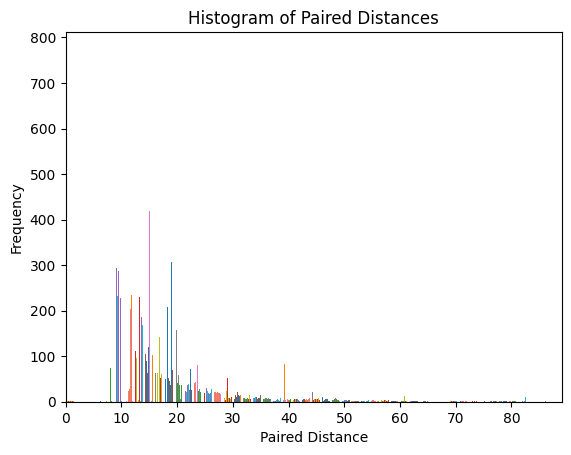

In [8]:
draw_histogram(mt_delicious, 'minkowski', 0, 89)

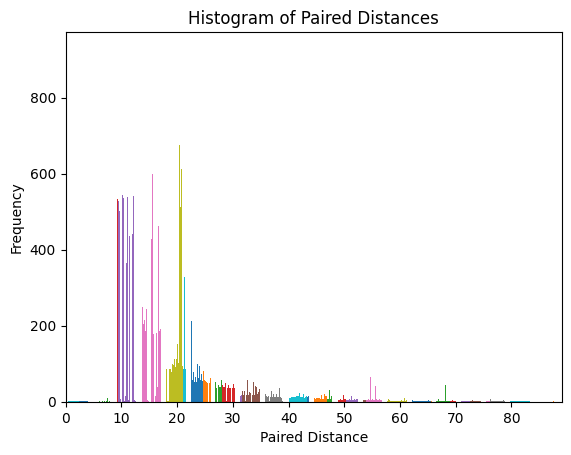

In [13]:
draw_histogram(mt_delicious, 'minkowski', 0, 89)

#### Grafos esparsificados

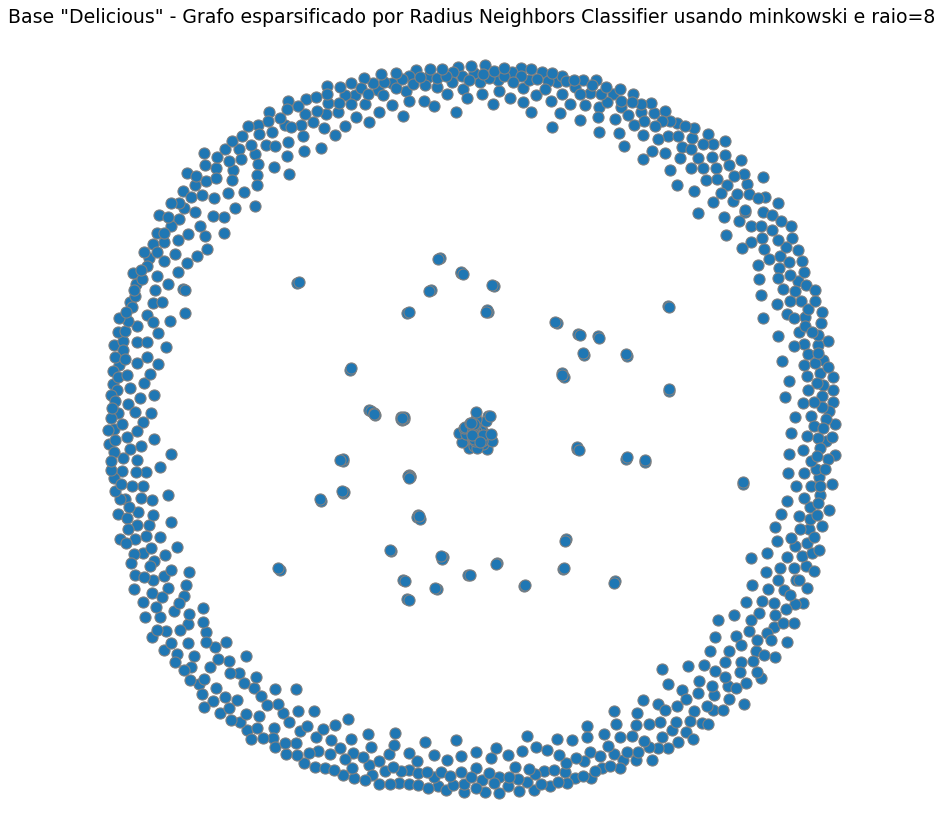

In [15]:
draw_rnc_graph(8,'minkowski', 'C0', mt_delicious)

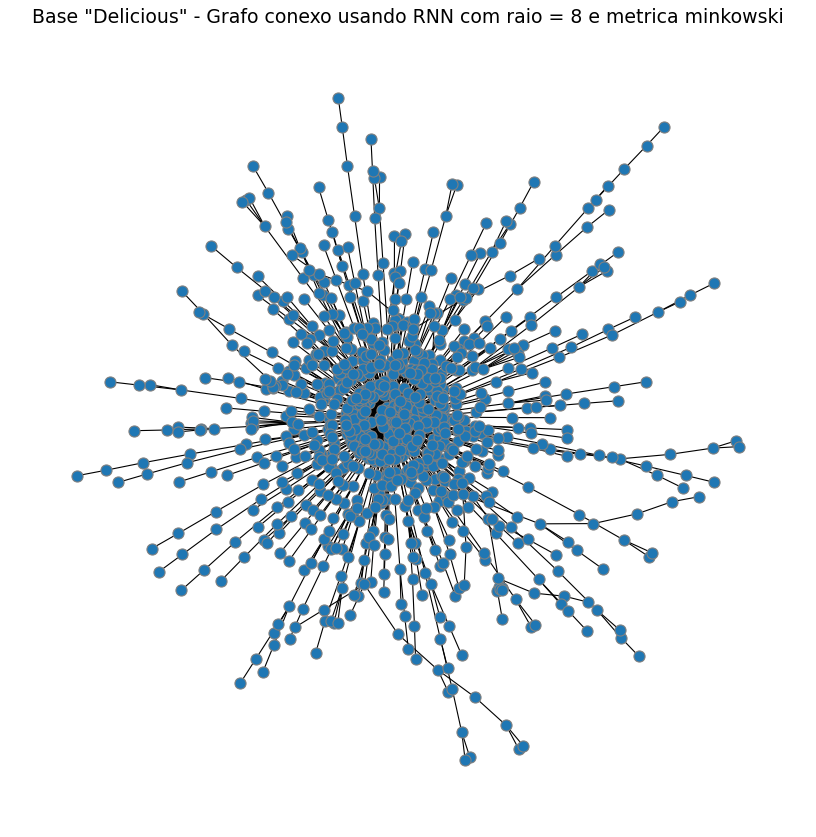

In [33]:
draw_conex_graph(8,'minkowski', 'C0', mt_delicious)

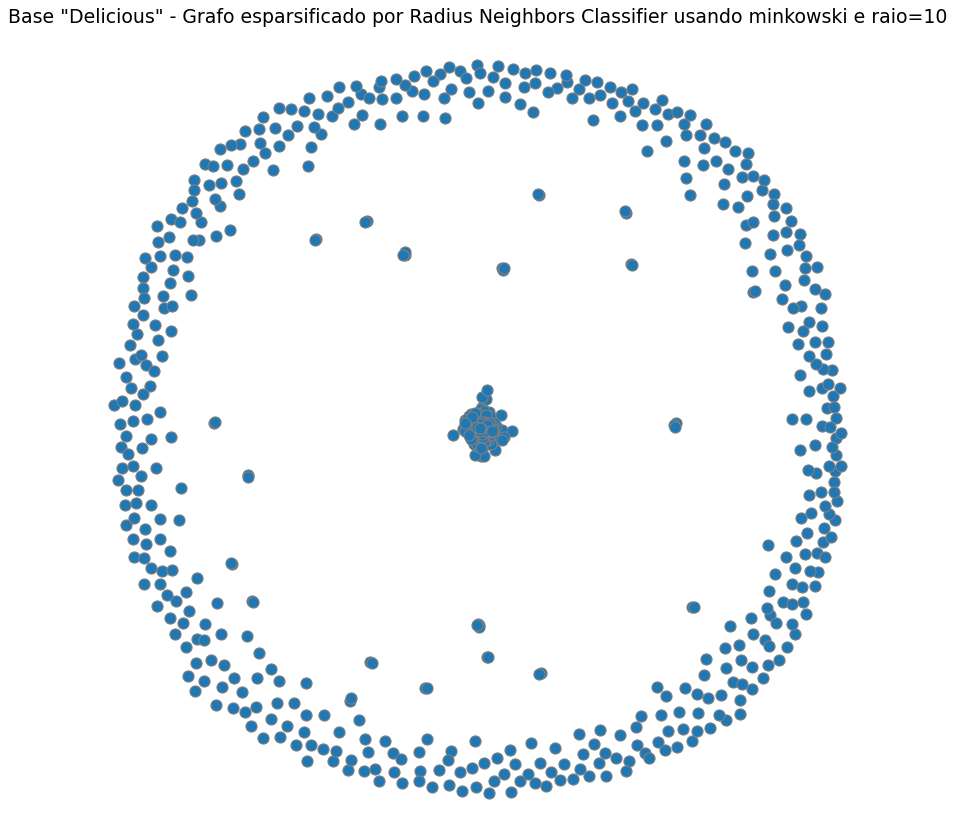

In [13]:
draw_rnc_graph(10,'minkowski', 'C0', mt_delicious)

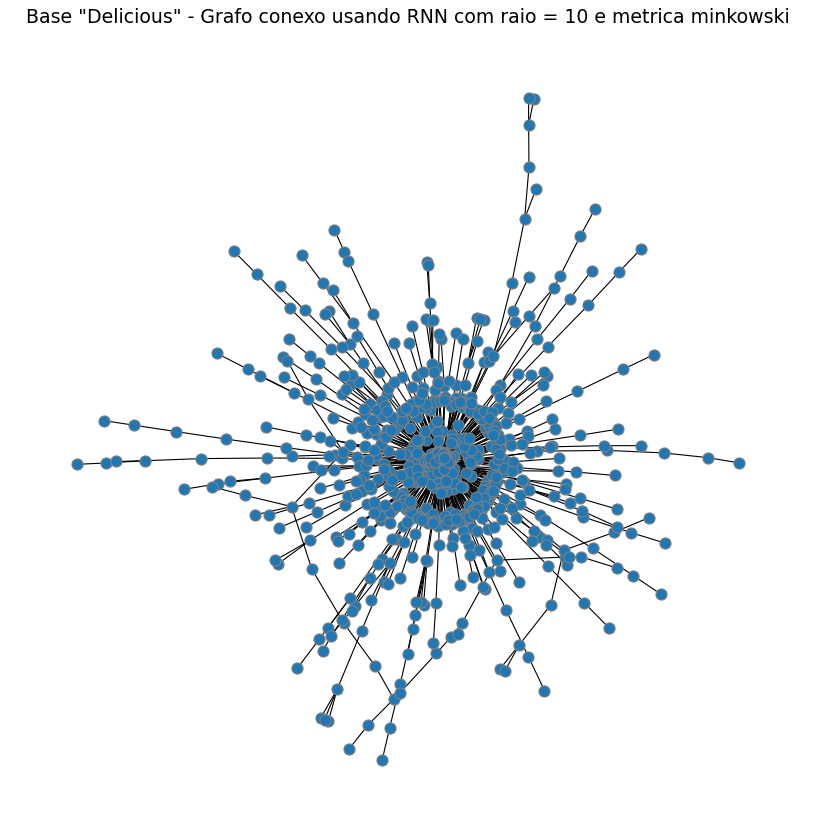

In [34]:
draw_conex_graph(10,'minkowski', 'C0', mt_delicious)

Minimum value in matrix: 0.0
Maximum value in matrix: 15.0


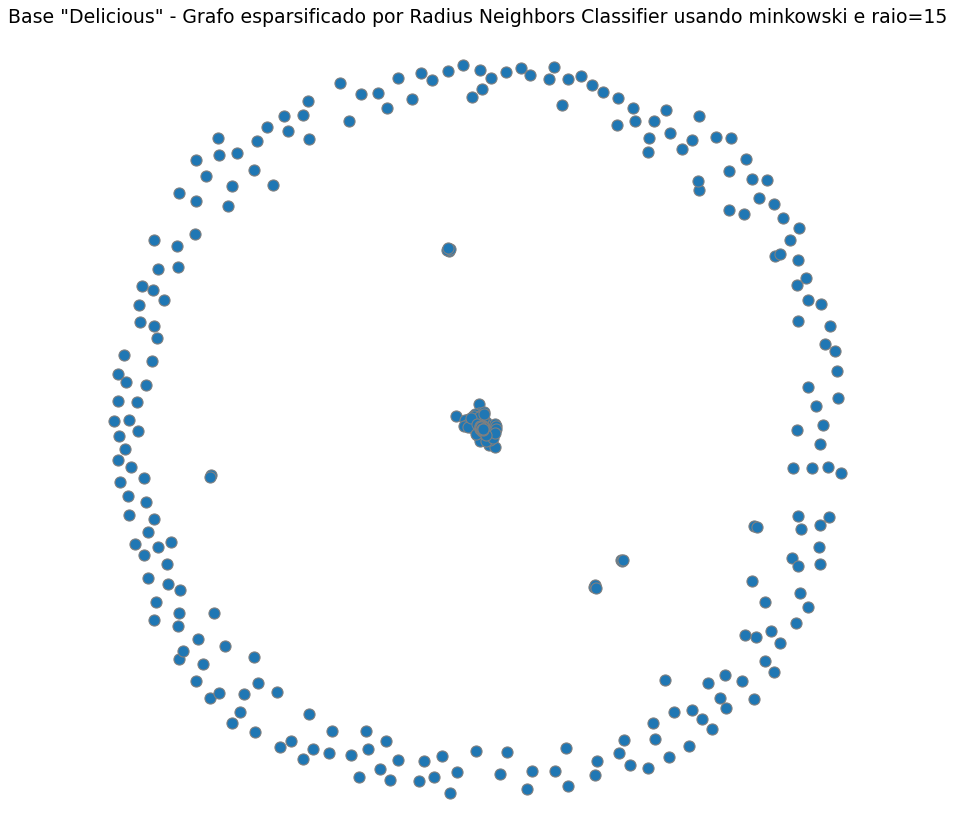

In [9]:
draw_rnc_graph(15,'minkowski', 'C0', mt_delicious)

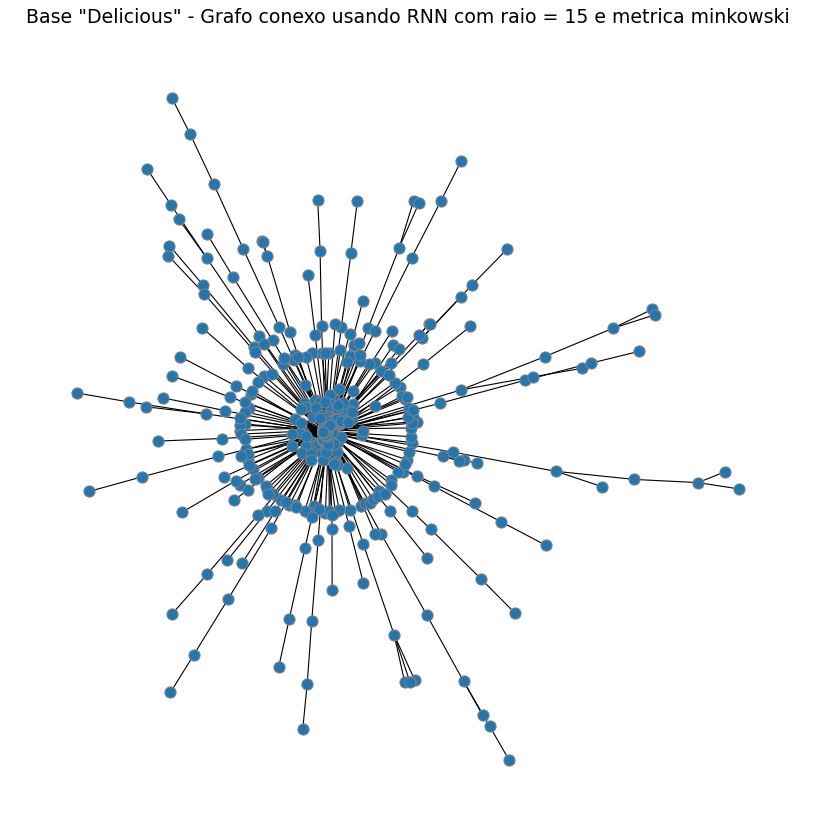

In [35]:
draw_conex_graph(15,'minkowski', 'C0', mt_delicious)

Minimum value in matrix: 0.0
Maximum value in matrix: 20.0


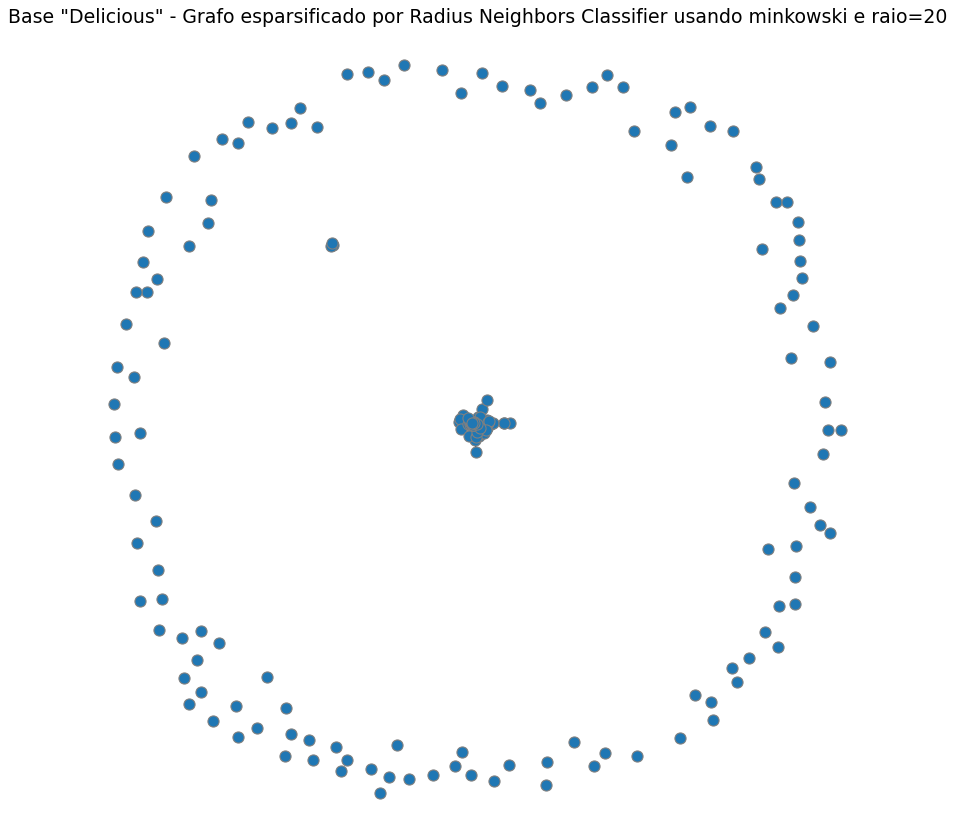

In [10]:
draw_rnc_graph(20,'minkowski', 'C0', mt_delicious)

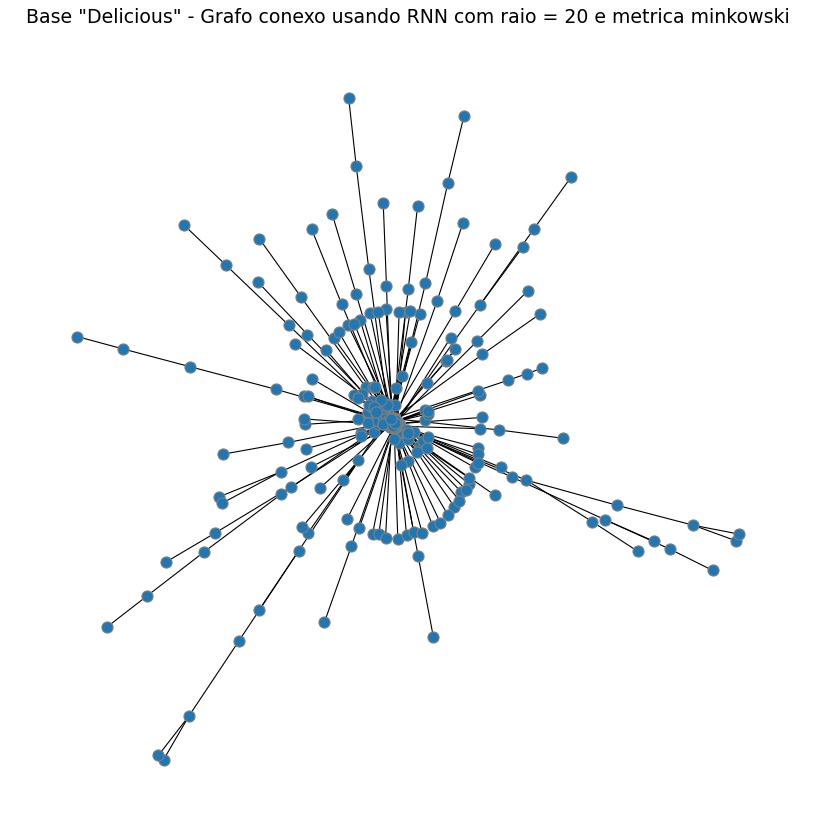

In [36]:
draw_conex_graph(20,'minkowski', 'C0', mt_delicious)

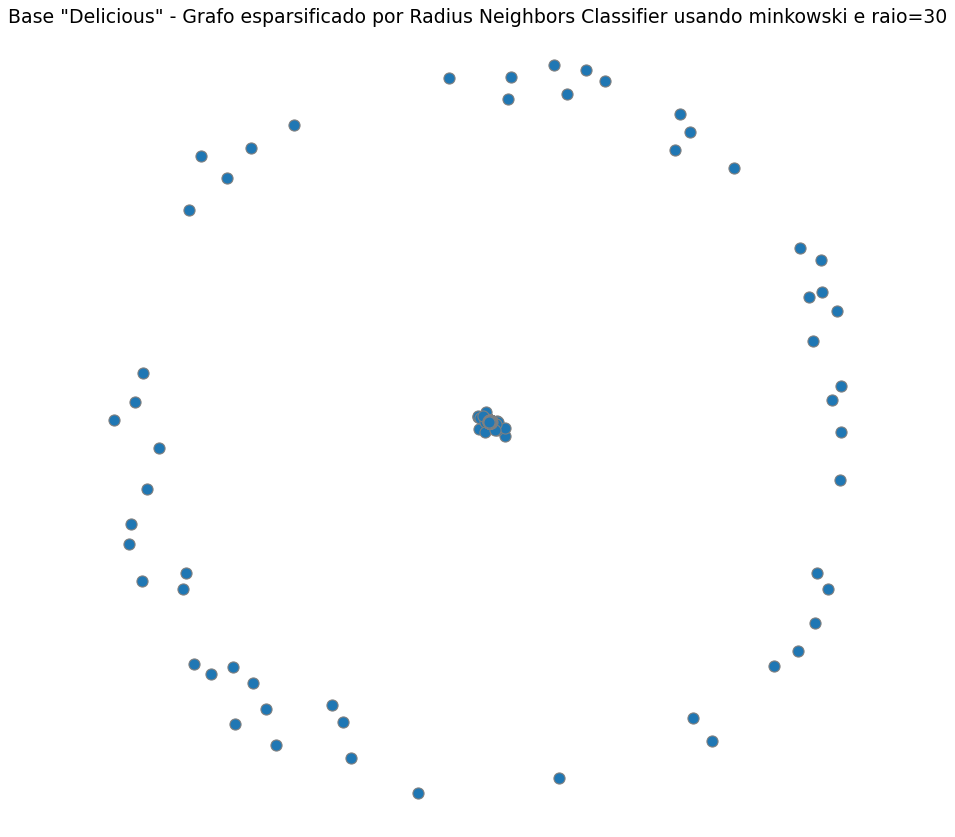

In [14]:
draw_rnc_graph(30,'minkowski', 'C0', mt_delicious)

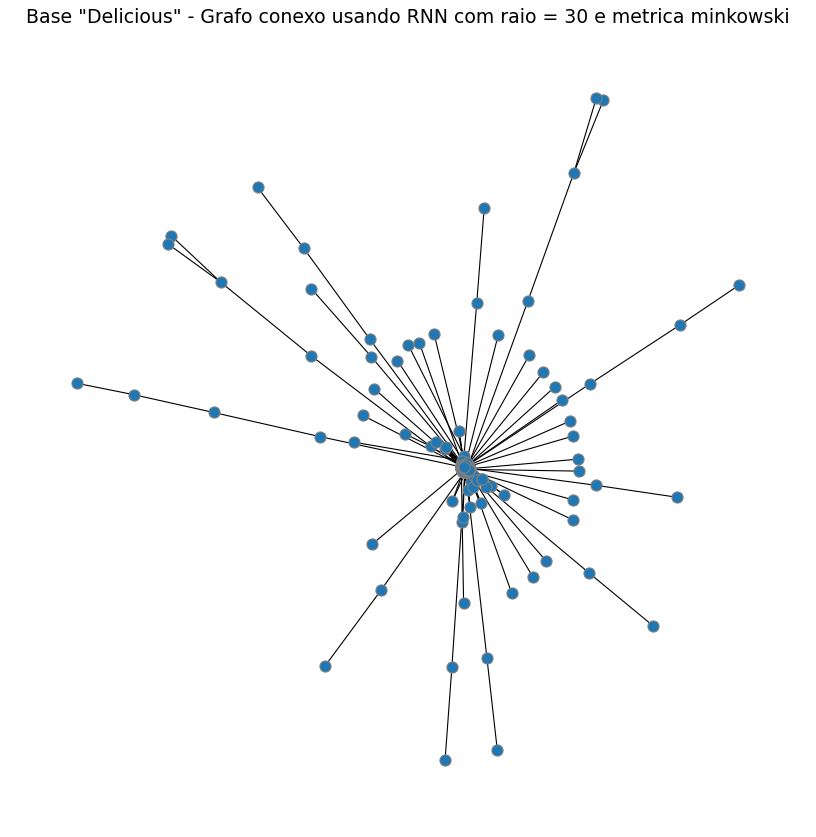

In [37]:
draw_conex_graph(30,'minkowski', 'C0', mt_delicious)

## 2.6) Hamming

#### Grafo completo e histograma

Minimum value in matrix: 0.0
Maximum value in matrix: 0.48221049363551693


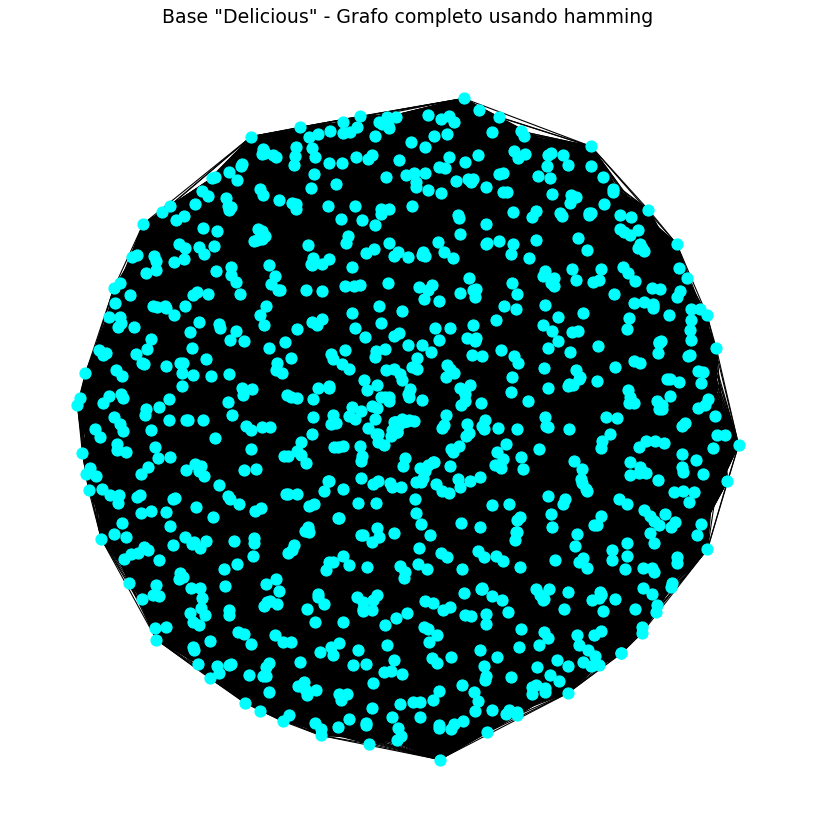

In [18]:
draw_graph('hamming', 'cyan', mt_delicious)

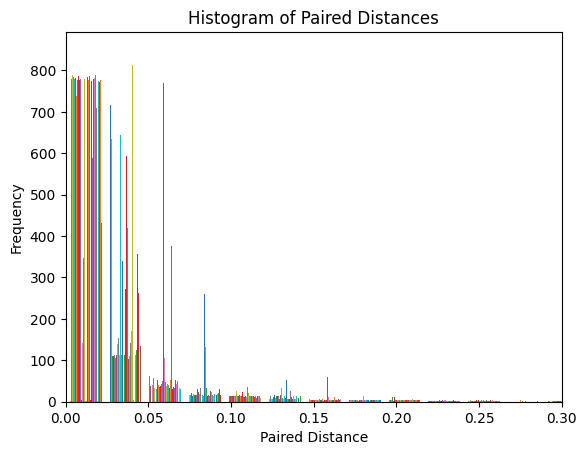

In [19]:
draw_histogram(mt_delicious,'hamming', 0,0.3)

#### Grafos esparsificados

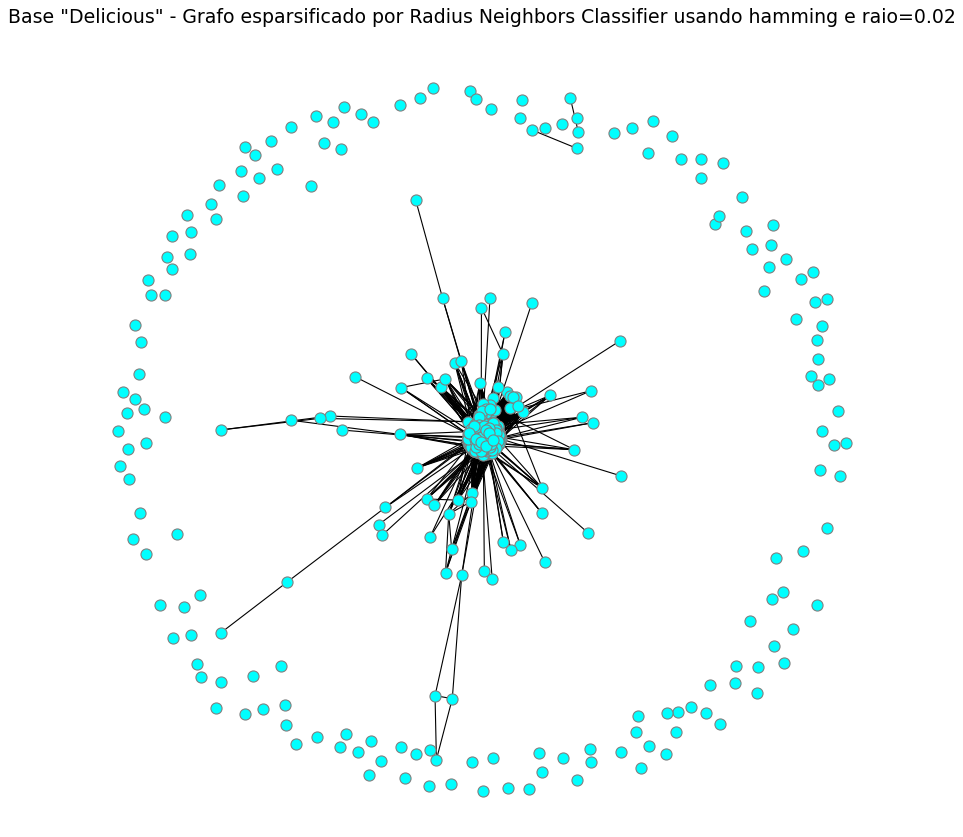

In [22]:
draw_rnc_graph(0.02, 'hamming', 'cyan', mt_delicious)

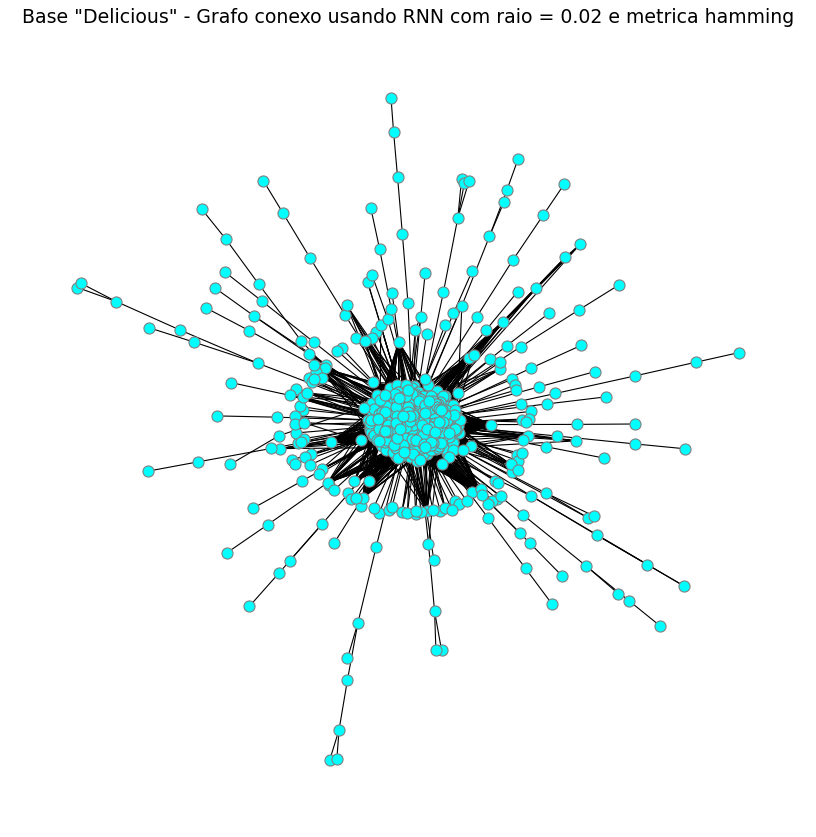

In [23]:
draw_conex_graph( 0.02, 'hamming',  'cyan' , mt_delicious)

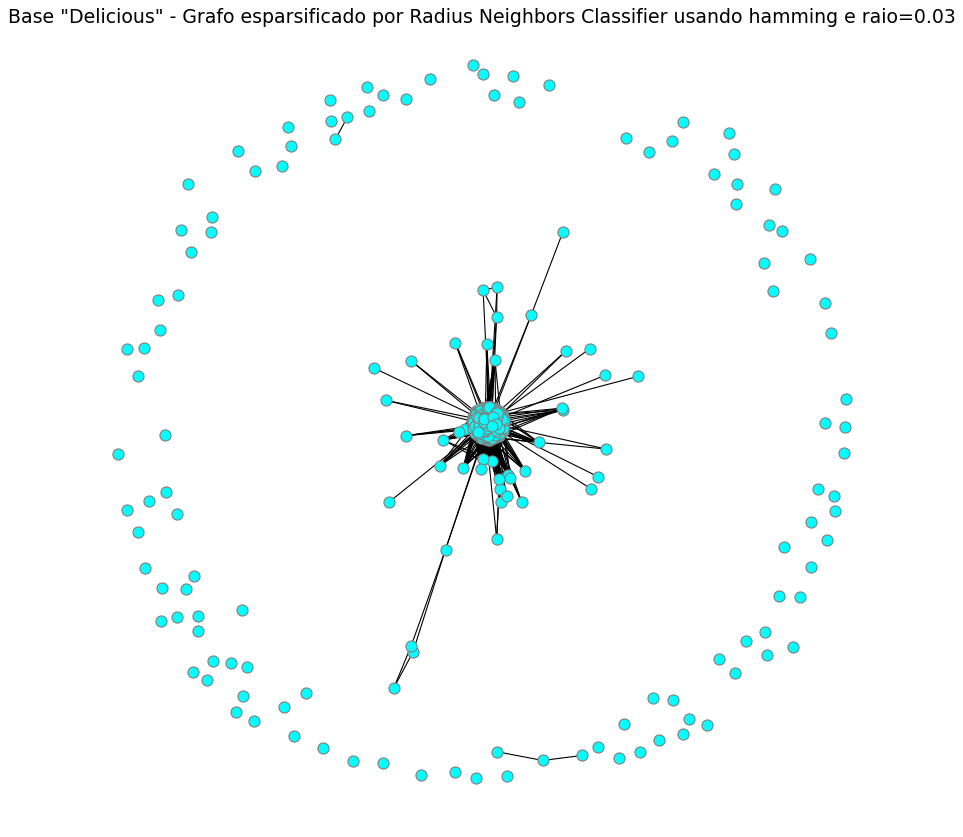

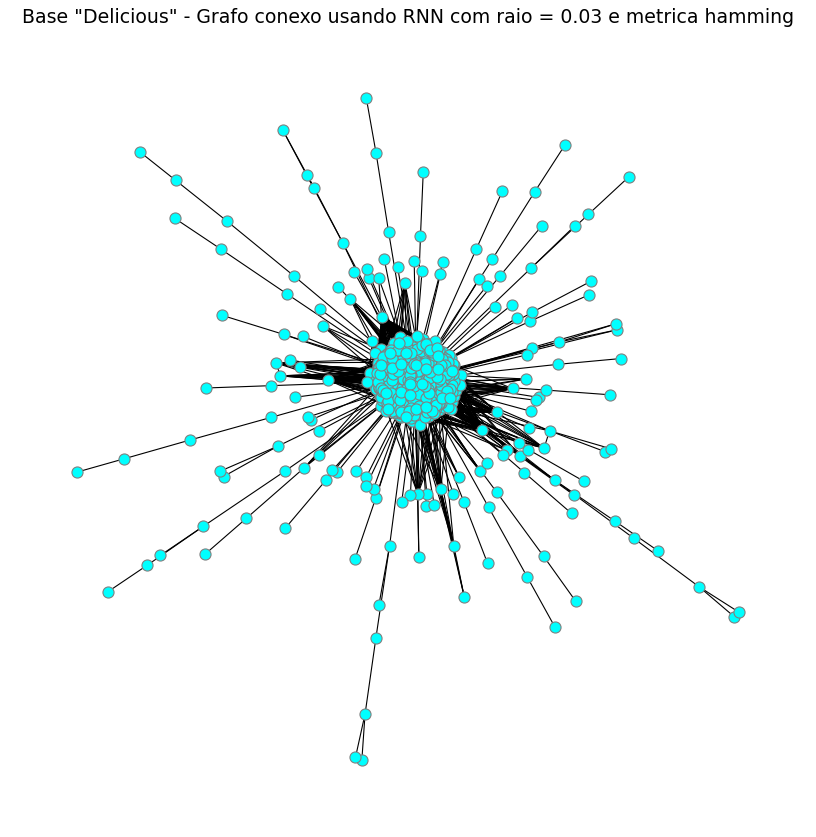

In [24]:
draw_rnc_graph(0.03, 'hamming', 'cyan', mt_delicious)
draw_conex_graph( 0.03, 'hamming',  'cyan' , mt_delicious)

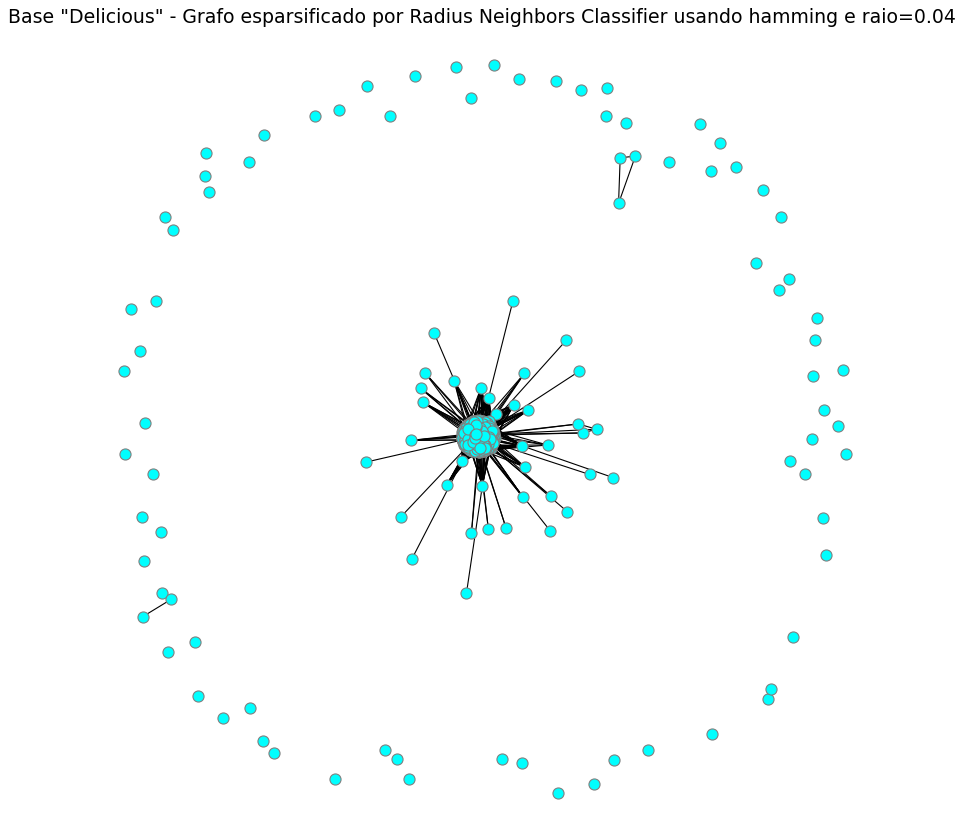

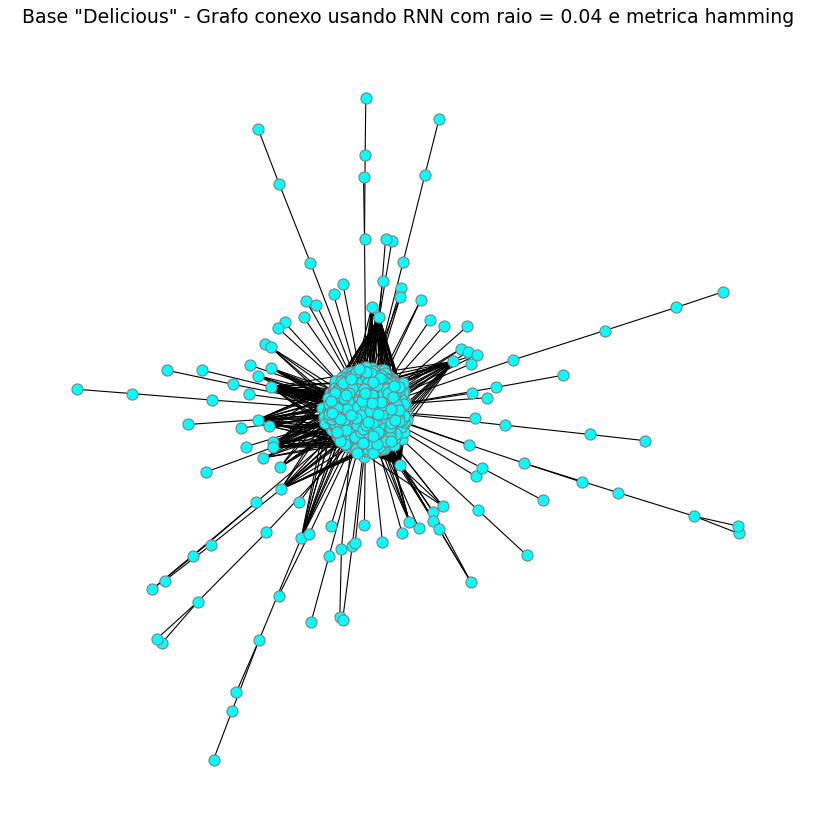

In [25]:
draw_rnc_graph(0.04, 'hamming', 'cyan', mt_delicious)
draw_conex_graph( 0.04, 'hamming',  'cyan' , mt_delicious)


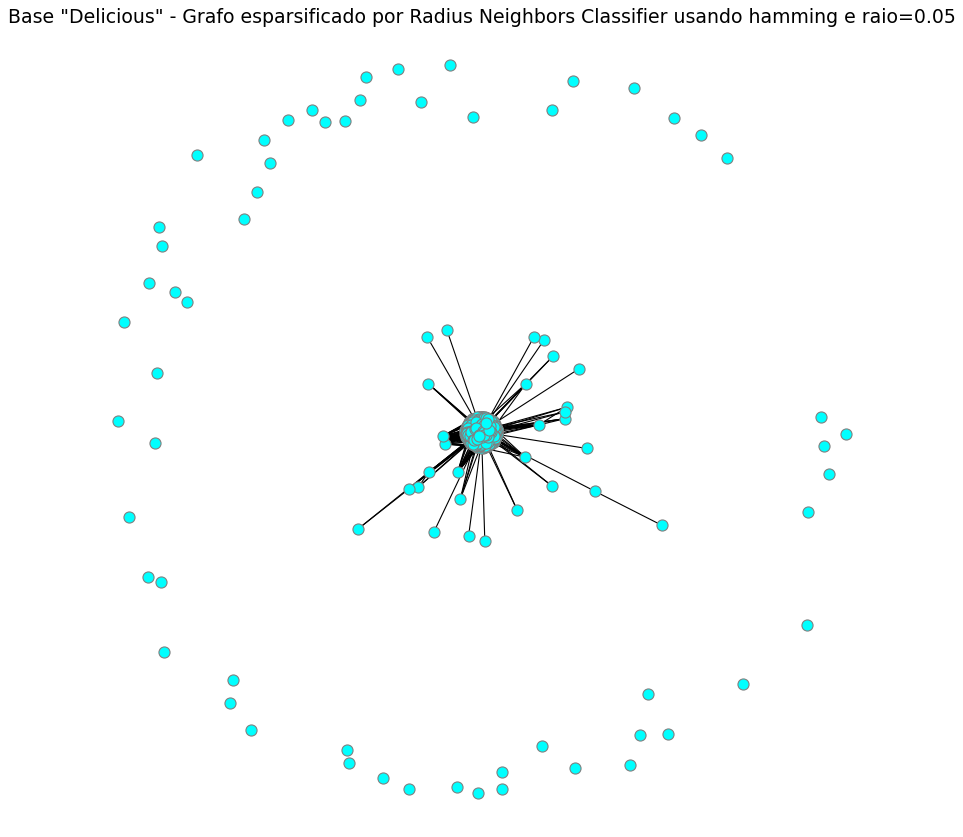

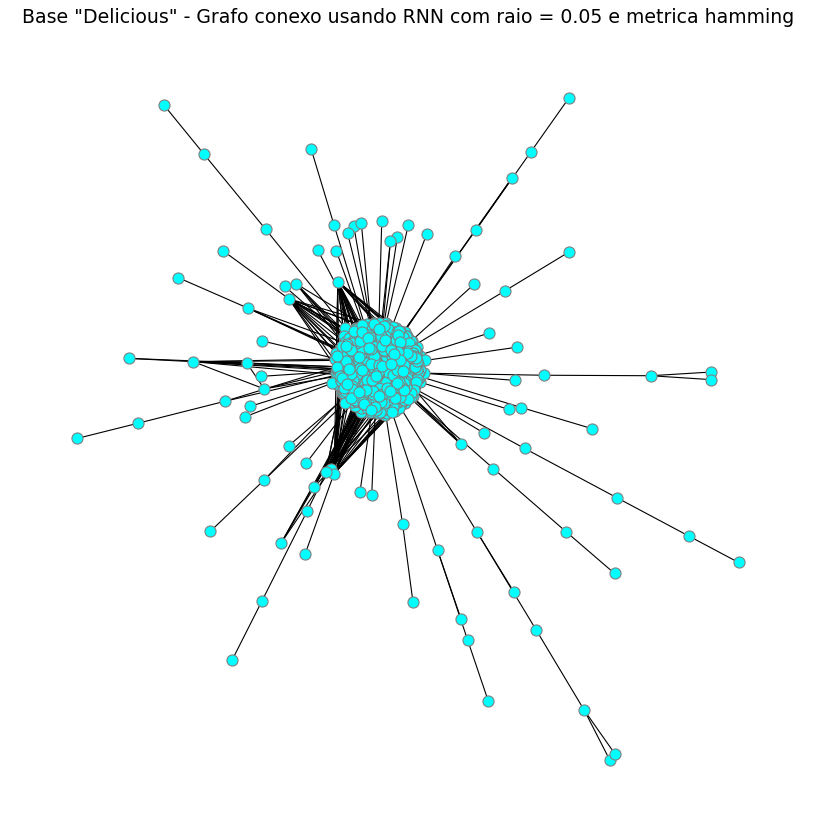

In [26]:
draw_rnc_graph(0.05, 'hamming', 'cyan', mt_delicious)
draw_conex_graph( 0.05, 'hamming',  'cyan' , mt_delicious)


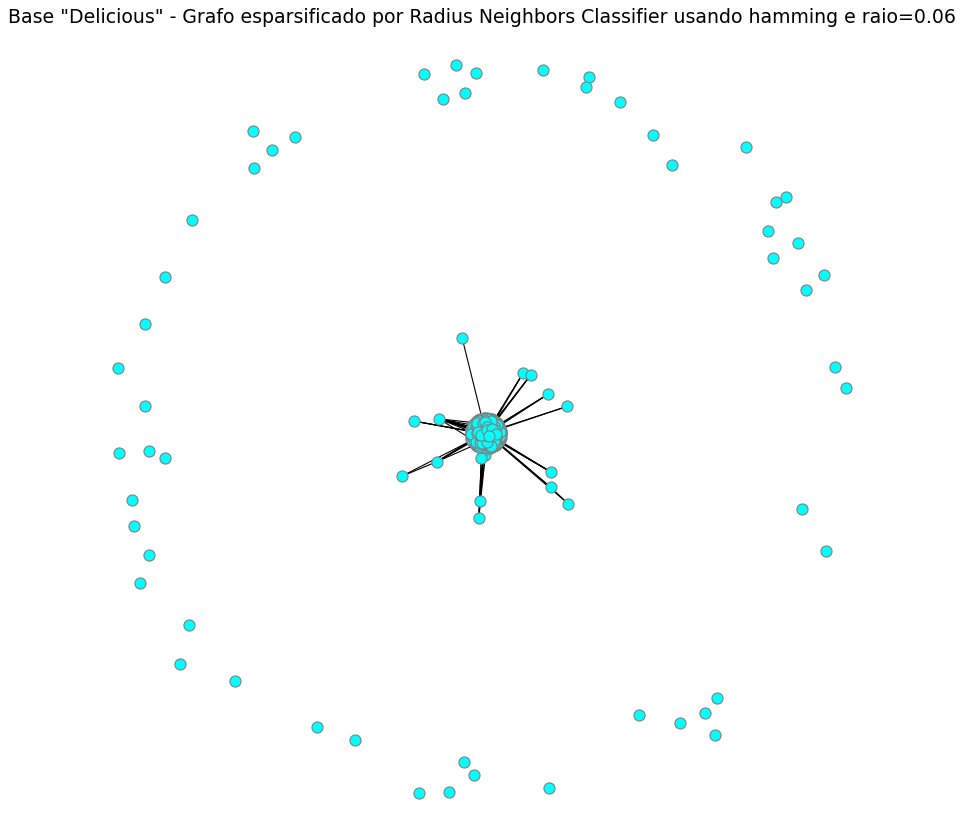

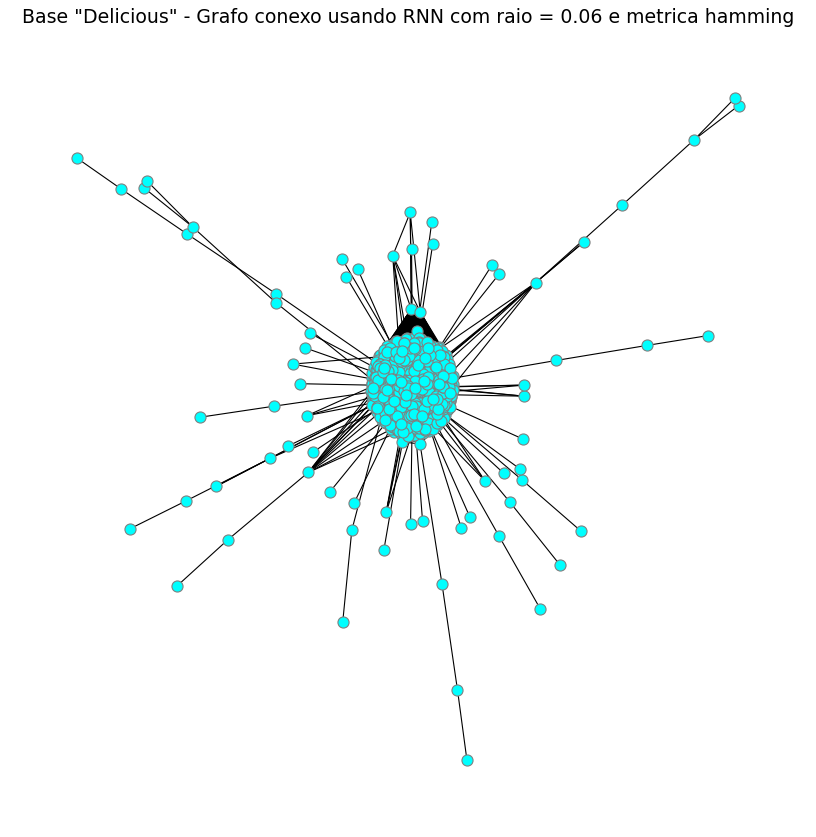

In [38]:
draw_rnc_graph(0.06, 'hamming', 'cyan', mt_delicious)
draw_conex_graph( 0.06, 'hamming',  'cyan' , mt_delicious)


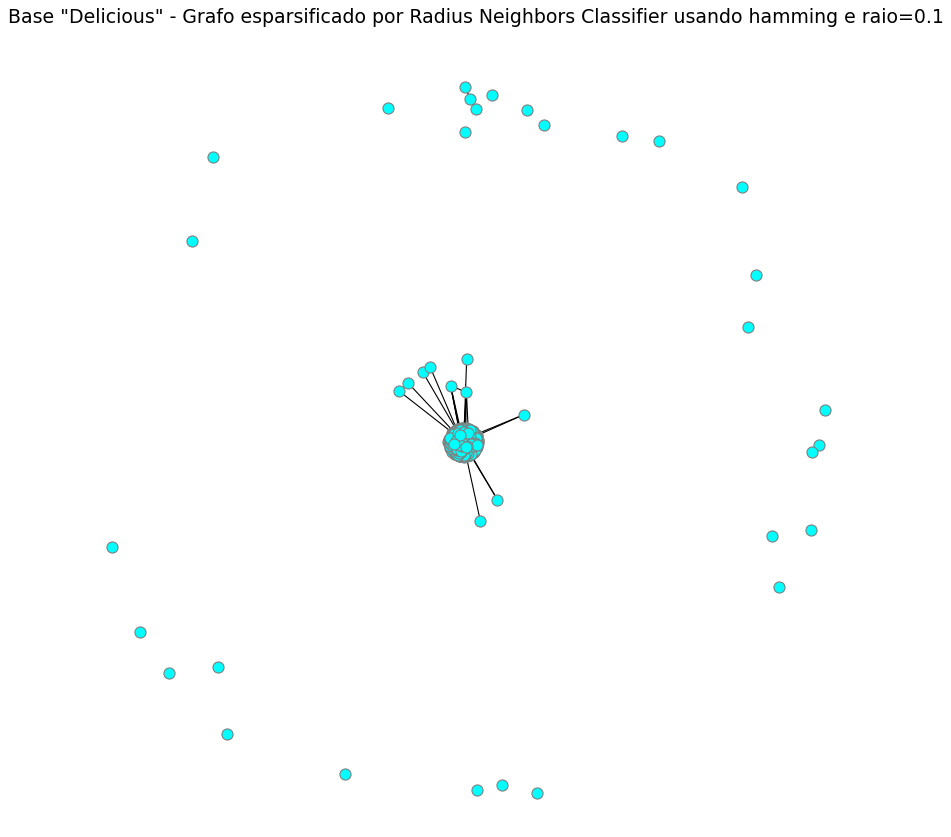

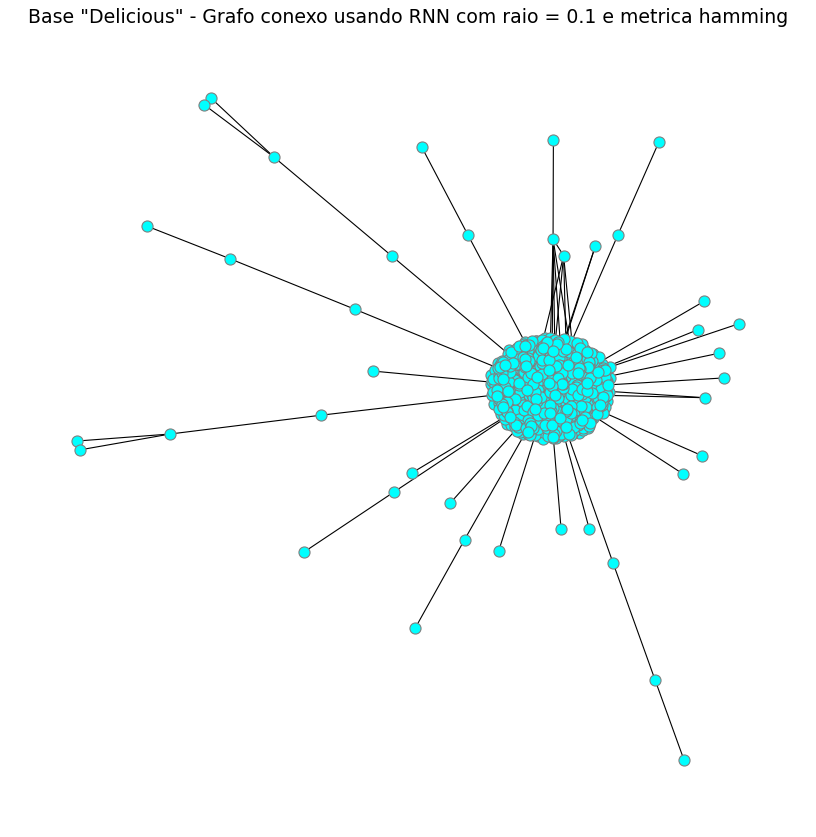

In [27]:
draw_rnc_graph(0.10, 'hamming', 'cyan', mt_delicious)
draw_conex_graph( 0.10, 'hamming',  'cyan' , mt_delicious)


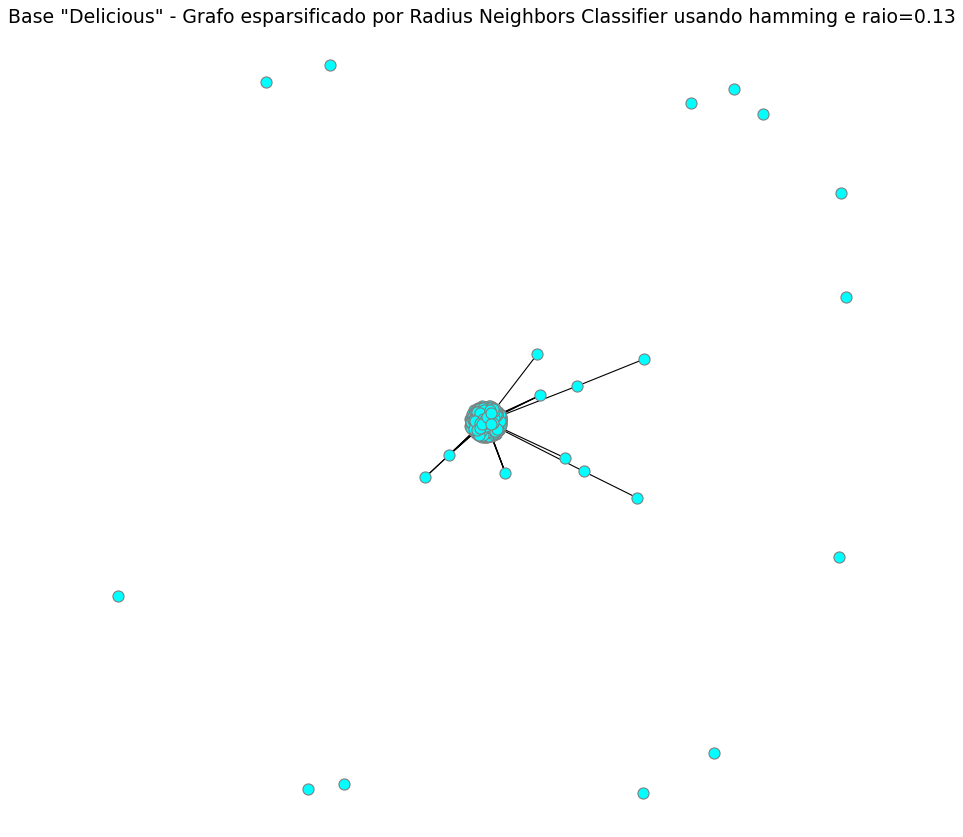

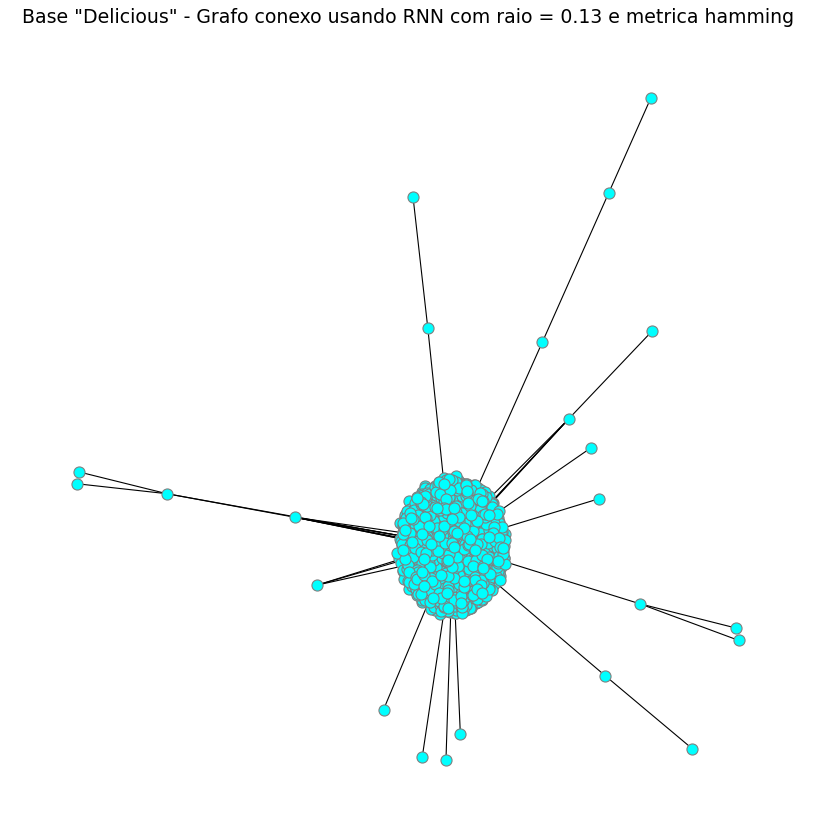

In [28]:
draw_rnc_graph(0.13, 'hamming', 'cyan', mt_delicious)
draw_conex_graph( 0.13, 'hamming',  'cyan' , mt_delicious)


## 2.7) Cosseno

#### Grafo completo e histograma

Minimum value in matrix: 0.0
Maximum value in matrix: 1.0


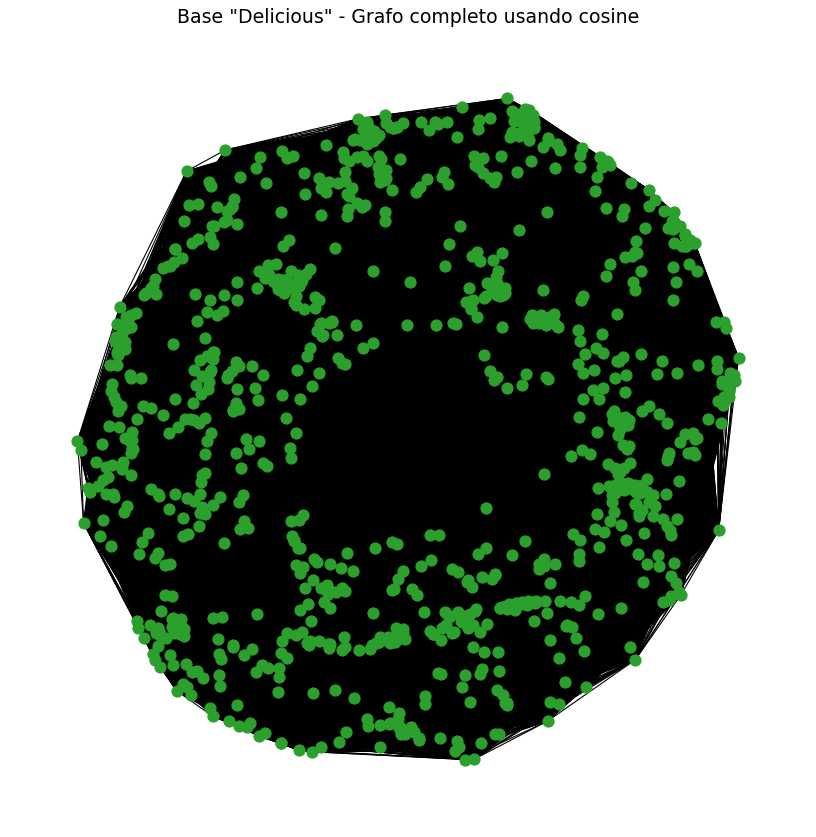

In [25]:
draw_graph('cosine', 'C2', mt_delicious)

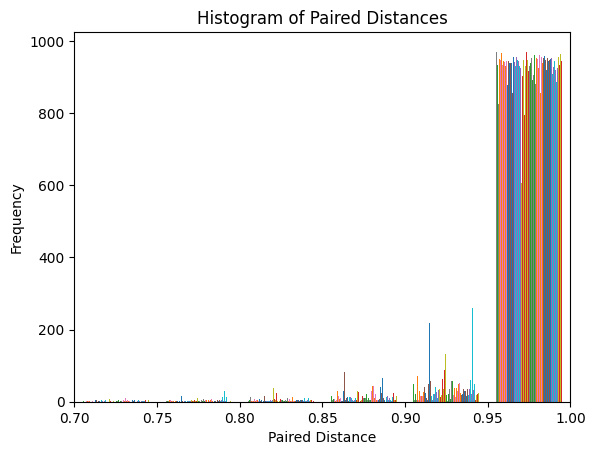

In [27]:
draw_histogram(mt_delicious, 'cosine', 0.7,1)

#### Grafos esparsificados

Minimum value in matrix: 0.0
Maximum value in matrix: 0.75


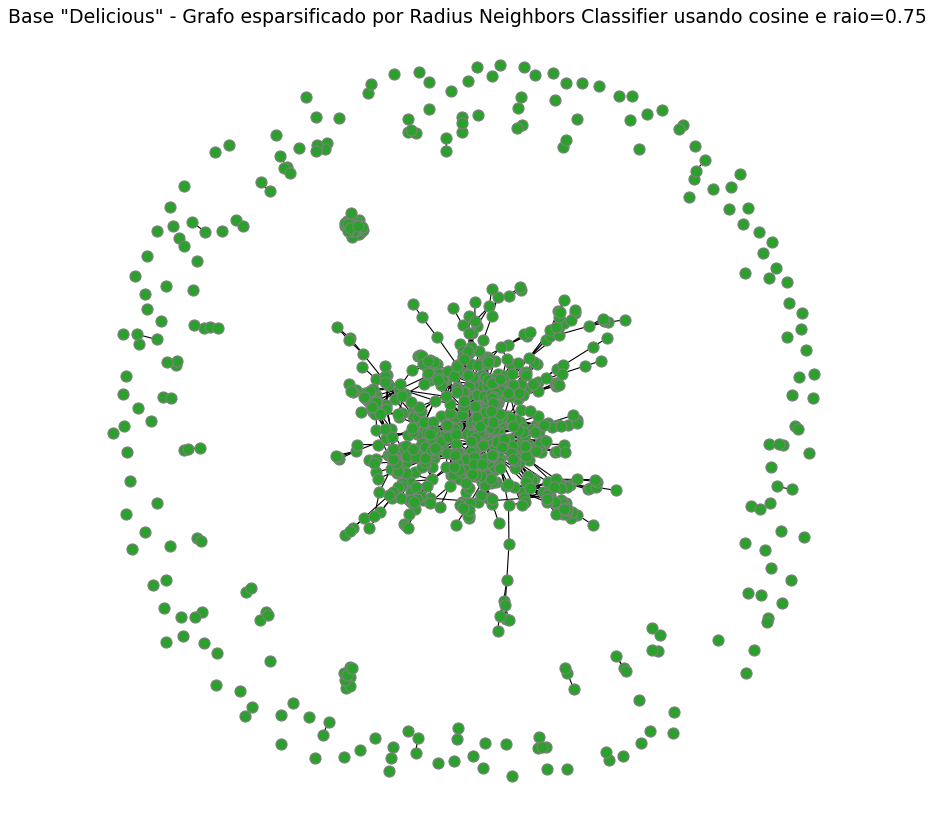

In [34]:
draw_rnc_graph(0.75,'cosine', 'C2', mt_delicious)

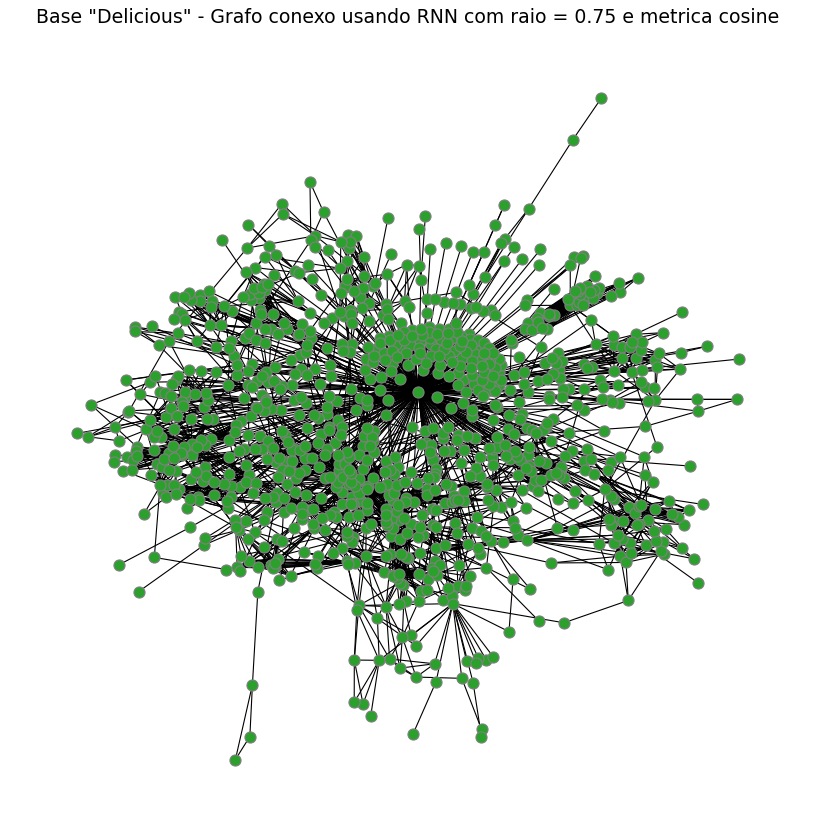

In [29]:
draw_conex_graph(0.75,'cosine', 'C2', mt_delicious)

Minimum value in matrix: 0.0
Maximum value in matrix: 0.829988075134279


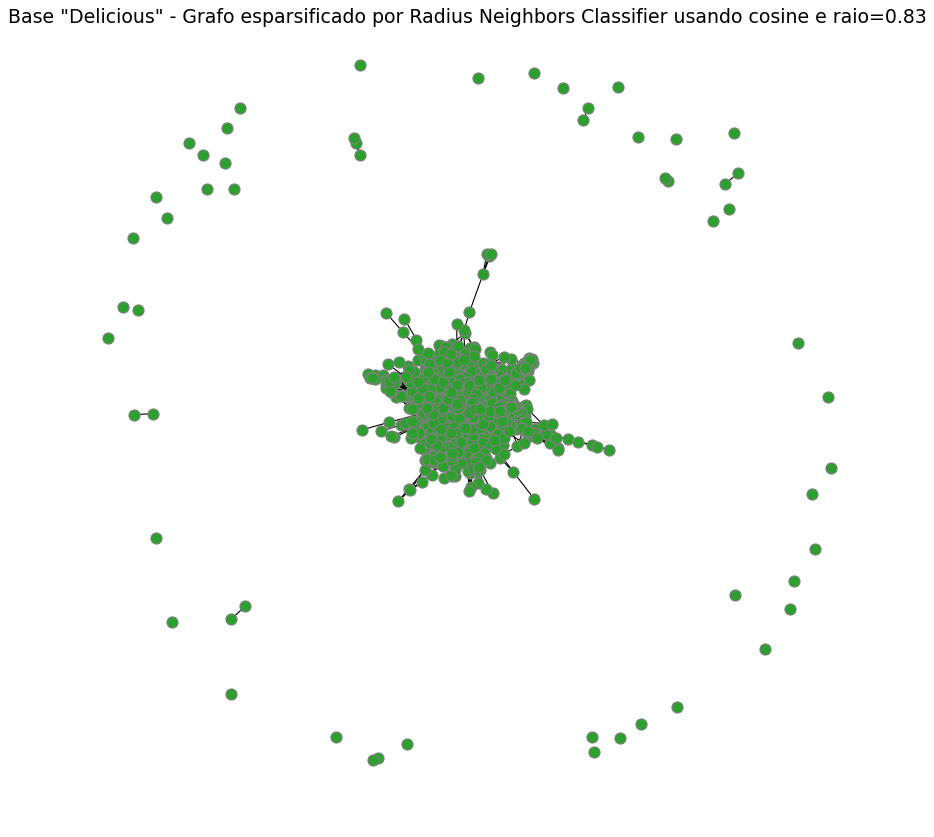

In [33]:
draw_rnc_graph(0.83,'cosine', 'C2', mt_delicious)

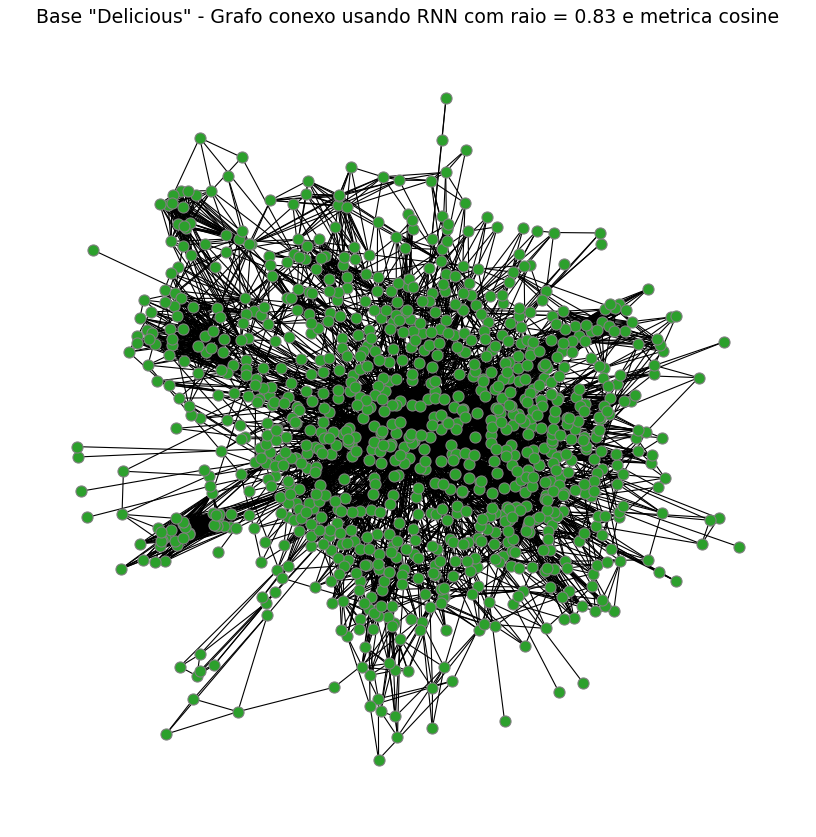

In [30]:
draw_conex_graph(0.83,'cosine', 'C2', mt_delicious)

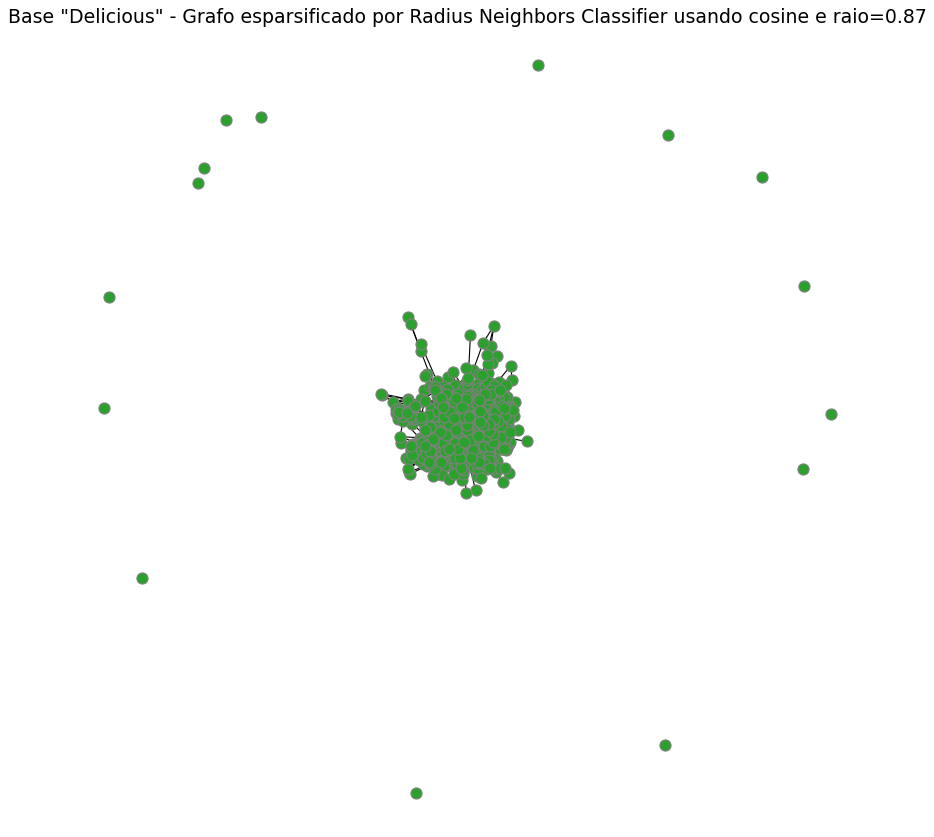

In [18]:
draw_rnc_graph(0.87,'cosine', 'C2', mt_delicious)

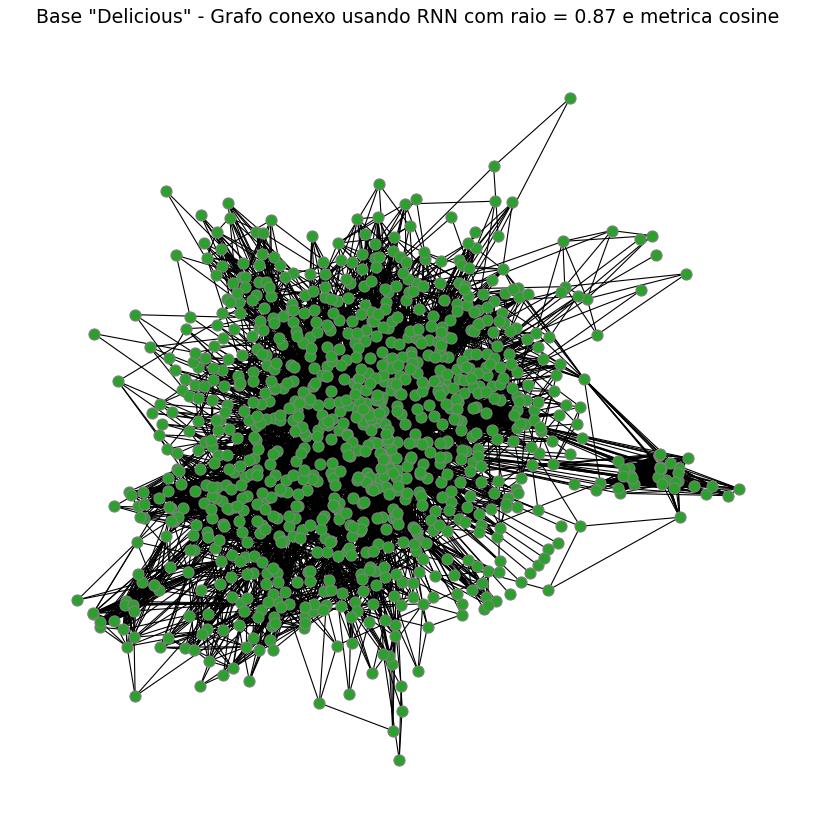

In [31]:
draw_conex_graph(0.87,'cosine', 'C2', mt_delicious)

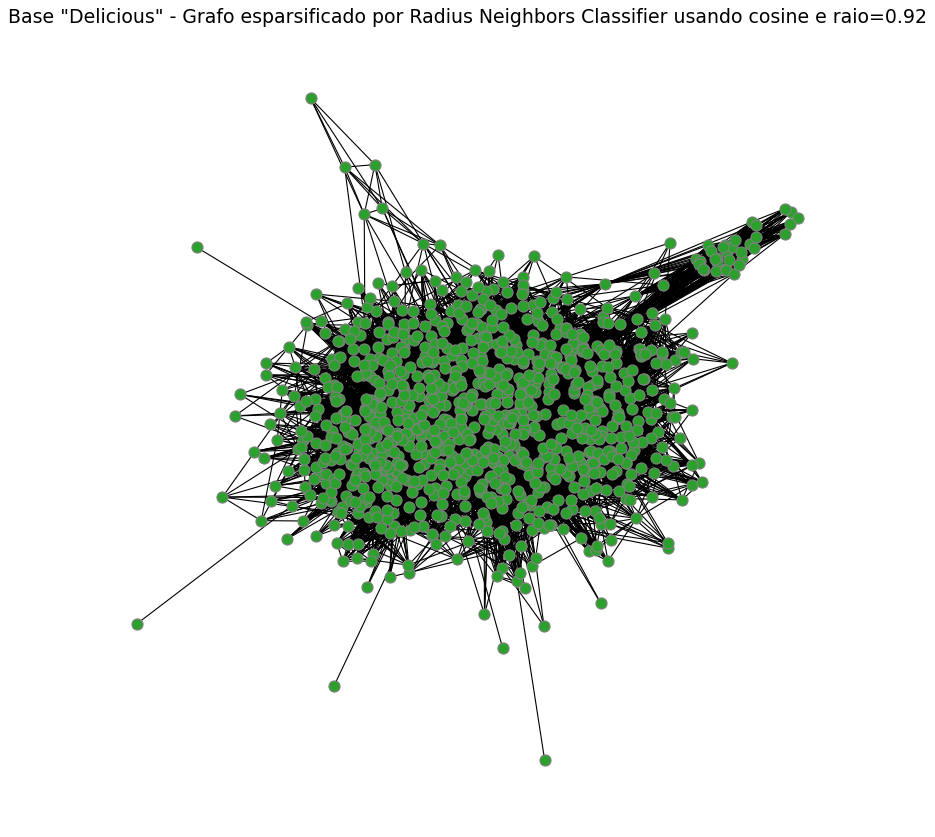

In [19]:
draw_rnc_graph(0.92,'cosine', 'C2', mt_delicious)

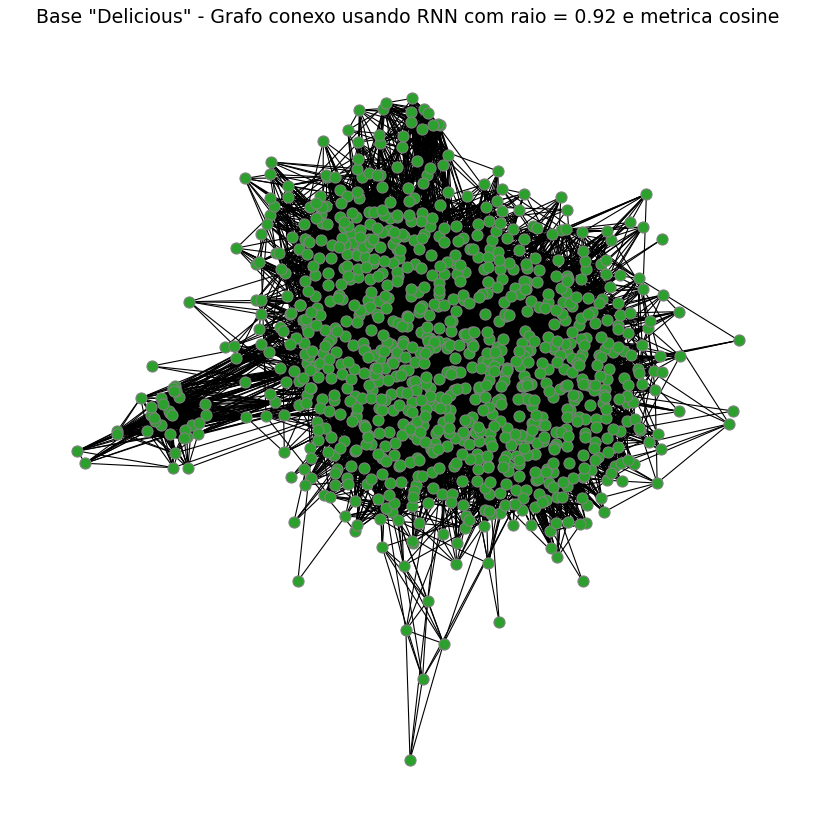

In [32]:
draw_conex_graph(0.92,'cosine', 'C2', mt_delicious)

Minimum value in matrix: 0.0
Maximum value in matrix: 0.95


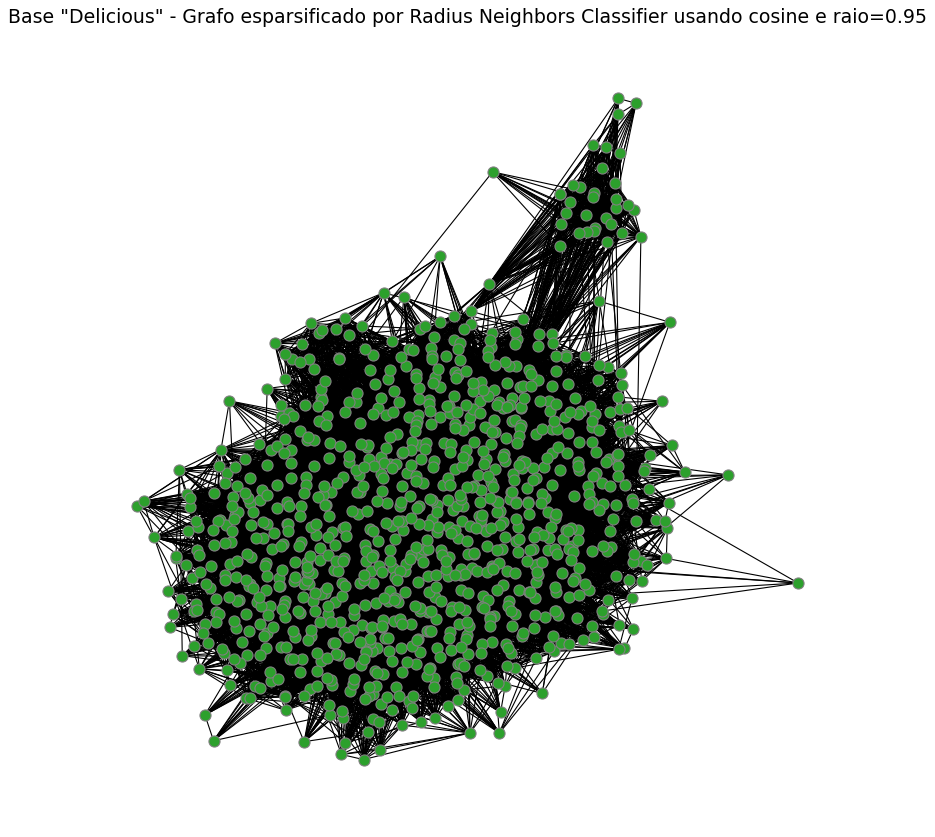

In [32]:
draw_rnc_graph(0.95,'cosine', 'C2', mt_delicious)

In [ ]:
draw_conex_graph(0.95,'cosine', 'C2', mt_delicious)

# Grid search 

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import RadiusNeighborsClassifier

# Definir a grade de parâmetros a ser testada
param_grid = {'radius': [0.1, 0.5, 1.0], 'metric': ['euclidean', 'manhattan']}

# Criar o estimador
estimator = RadiusNeighborsClassifier()

# Criar o objeto GridSearchCV
grid_search = GridSearchCV(estimator, param_grid, cv=5)

# Ajustar o modelo aos dados
grid_search.fit(matriz, target)

# Exibir os melhores parâmetros e a pontuação
print('Melhores parâmetros:', grid_search.best_params_)
print('Melhor pontuação:', grid_search.best_score_)
